In [12]:
import pickle
import pandas as pd
import numpy as np
import lightgbm as lgb
import time
import matplotlib.pyplot as plt

from sklearn.impute import KNNImputer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PowerTransformer, StandardScaler, MinMaxScaler
from sklearn.compose import TransformedTargetRegressor

from bayes_opt import BayesianOptimization, SequentialDomainReductionTransformer

pd.set_option('display.max_columns', None)
plt.rcParams["figure.figsize"] = (10,5)

from importlib import reload
import run_models, output, process_df
from run_models import create_and_fit_regression_rf, create_and_fit_regression_lgb, create_and_fit_regression_nn, create_regression_lgb, build_nn_model, get_regression_cv_metrics, get_regression_cv_predictions
from output import output_metrics, print_train_history, print_metrics, print_graphs
reload(run_models)
reload(output)
reload(process_df)
from run_models import create_and_fit_regression_rf, create_and_fit_regression_lgb, create_and_fit_regression_nn, create_regression_lgb, build_nn_model, get_regression_cv_metrics, get_regression_cv_predictions
from output import output_metrics, print_train_history, print_metrics, print_graphs

In [13]:
tags = [ 'tag__murder',
 'tag__violence',
 'tag__flashback',
 'tag__romantic',
 'tag__cult',
 'tag__revenge',
 'tag__psychedelic',
 'tag__comedy',
 'tag__suspenseful',
 'tag__good_versus_evil',
 'tag__humor',
 'tag__entertaining',
 'tag__neo_noir',
 'tag__action',
 'tag__boring',
 'tag__other']

In [60]:
# with open(f'outliers/final/nan_filled_data.pickle', 'rb') as handle:
with open(f'outliers/final/df_raw_data.pickle', 'rb') as handle:
    data = pickle.load(handle)

X_train, y_train, X_val, y_val, X_test, y_test = data['X_train'], data['y_train'], data['X_val'], data['y_val'], data['X_test'], data['y_test']
X = pd.concat([X_train, X_test, X_val])
# X = X[[c for c in X.columns if 'tag' not in c or c in tags]]
y = np.concatenate([y_train, y_test, y_val])

In [61]:
def print_formatted(obj):
    for p in obj:
        val = obj[p]
        val = val if isinstance(val, int) or isinstance(val, float) else f'\'{val}\''
        print(f'{p}={val},')

def print_output(obj):
    for p in obj:
        print(f'{p}: {obj[p]}')
   
def print_formatted_params(params):
    print_formatted(convert_lgb_params(params))

In [62]:
def convert_lgb_params(params):
    objectives = ['mse', 'mae', 'huber', 'fair', 'quantile', 'mape']
    tree_learners = ['serial', 'feature', 'data', 'voting']

    get_float = lambda val: max(min(val, 1), 0)
    get_int = lambda val: int(round(val))
    get_objective = lambda i: objectives[max(min(get_int(i), 5), 0)]
    get_tree_learner = lambda i: tree_learners[max(min(get_int(i), 3), 0)]

    return_params = {
        'metrics': ['mae', 'mape'],
        'tree_learner':'data',
        'verbose': -1,
        'n_jobs': -1,
        'objective': get_objective(params['objective']),
        'tree_learner': get_tree_learner(params['tree_learner']),
        'reg_lambda': params['reg_lambda'],
    }
    int_params = ['num_leaves', 'max_depth', 'min_data_in_leaf', 'min_child_samples', 'bagging_freq', 'n_estimators', 'min_sum_hessian_in_leaf']
    float_params = ['learning_rate', 'feature_fraction', 'bagging_fraction', 'subsample', 'min_child_weight', 'colsample_bytree', 'reg_alpha']
    for param in int_params:
        return_params[param] = get_int(params[param])
    for param in float_params:
        return_params[param] = get_float(params[param])
    return return_params

In [63]:
indices = (y > 10000000) & (y <= 100000000)

In [64]:
yy = y[indices]
Xx = X[indices]

split 1
[LightGBM] [Warning] bagging_fraction is set=0.6675607273702425, subsample=0.14235451782817768 will be ignored. Current value: bagging_fraction=0.6675607273702425
[LightGBM] [Warning] min_sum_hessian_in_leaf is set=47, min_child_weight=0.3016919119420111 will be ignored. Current value: min_sum_hessian_in_leaf=47
[LightGBM] [Warning] min_data_in_leaf is set=28, min_child_samples=158 will be ignored. Current value: min_data_in_leaf=28
[LightGBM] [Warning] bagging_freq is set=70, subsample_freq=0 will be ignored. Current value: bagging_freq=70
[LightGBM] [Warning] feature_fraction is set=0.9386698820528618, colsample_bytree=0.3804265687037845 will be ignored. Current value: feature_fraction=0.9386698820528618
model fit time: 1.4029974937438965
train
smape: 38.732
mape: 45.683
wape: 36.513
mae: 14,185,030.000
rmse: 19,123,455.000
r2: 0.390
adj_r2: 0.343
test
smape: 46.947
mape: 54.120
wape: 45.199
mae: 17,123,015.000
rmse: 21,849,196.000
r2: 0.119
adj_r2: -2.114


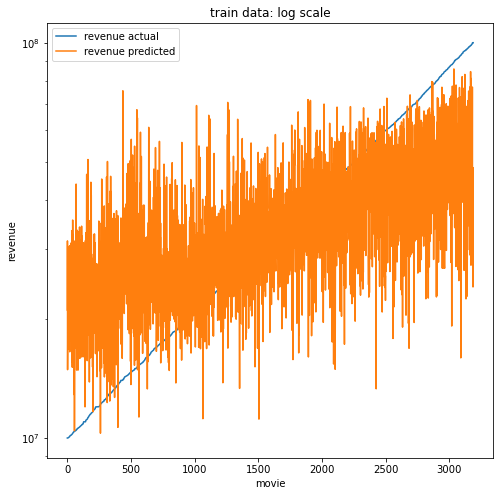

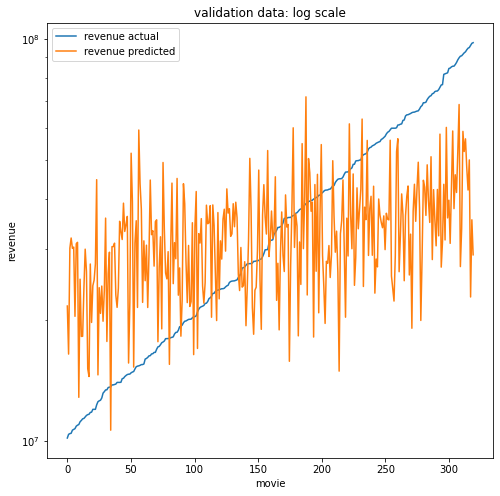

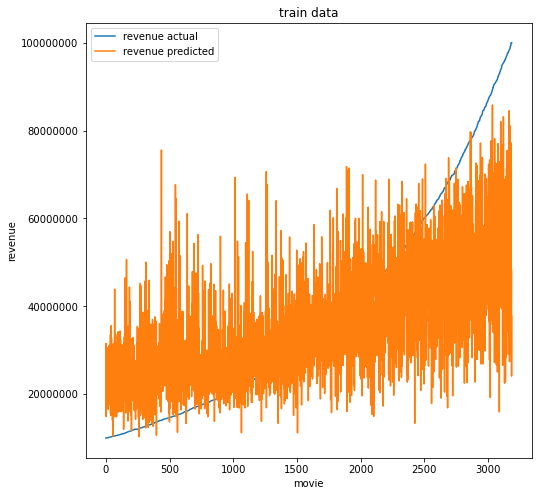

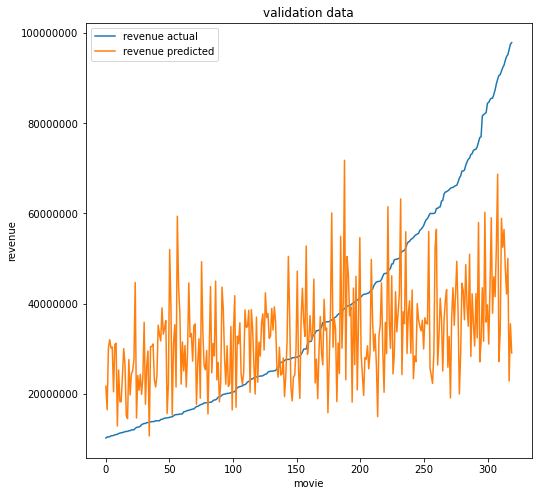

split 2
[LightGBM] [Warning] bagging_fraction is set=0.6675607273702425, subsample=0.14235451782817768 will be ignored. Current value: bagging_fraction=0.6675607273702425
[LightGBM] [Warning] min_sum_hessian_in_leaf is set=47, min_child_weight=0.3016919119420111 will be ignored. Current value: min_sum_hessian_in_leaf=47
[LightGBM] [Warning] min_data_in_leaf is set=28, min_child_samples=158 will be ignored. Current value: min_data_in_leaf=28
[LightGBM] [Warning] bagging_freq is set=70, subsample_freq=0 will be ignored. Current value: bagging_freq=70
[LightGBM] [Warning] feature_fraction is set=0.9386698820528618, colsample_bytree=0.3804265687037845 will be ignored. Current value: feature_fraction=0.9386698820528618
model fit time: 1.6747205257415771
train
smape: 28.772
mape: 33.224
wape: 26.513
mae: 10,300,162.000
rmse: 14,743,536.000
r2: 0.638
adj_r2: 0.610
test
smape: 50.881
mape: 62.582
wape: 48.903
mae: 19,100,921.000
rmse: 24,212,546.000
r2: 0.065
adj_r2: -2.304


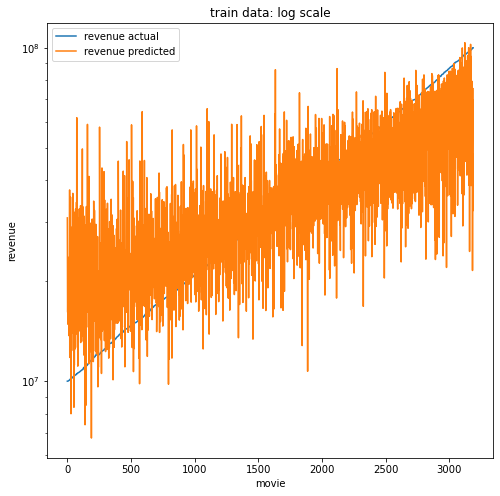

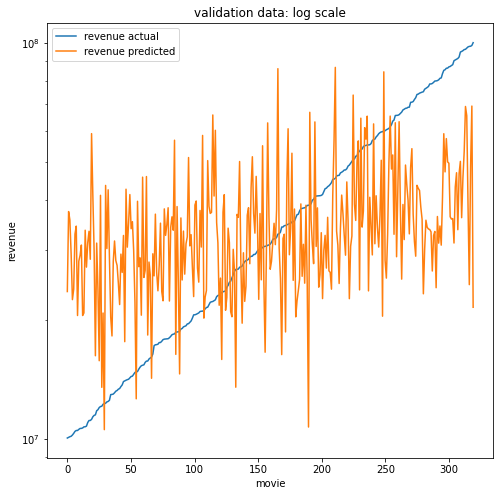

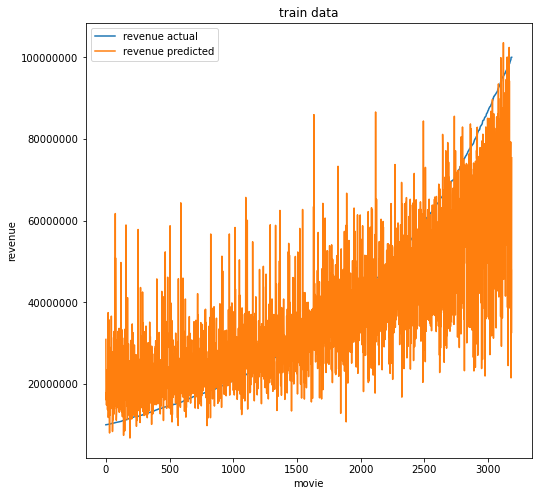

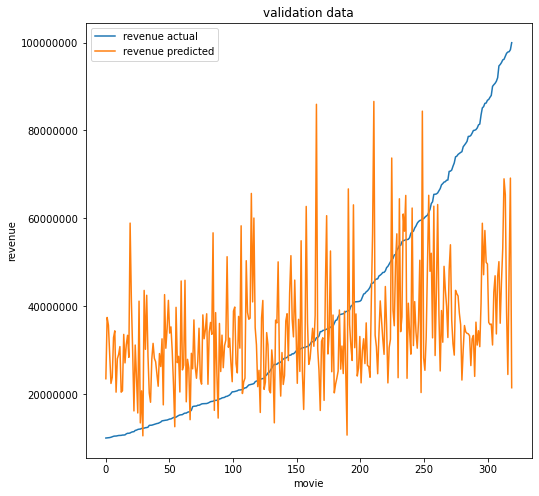

split 3
[LightGBM] [Warning] bagging_fraction is set=0.6675607273702425, subsample=0.14235451782817768 will be ignored. Current value: bagging_fraction=0.6675607273702425
[LightGBM] [Warning] min_sum_hessian_in_leaf is set=47, min_child_weight=0.3016919119420111 will be ignored. Current value: min_sum_hessian_in_leaf=47
[LightGBM] [Warning] min_data_in_leaf is set=28, min_child_samples=158 will be ignored. Current value: min_data_in_leaf=28
[LightGBM] [Warning] bagging_freq is set=70, subsample_freq=0 will be ignored. Current value: bagging_freq=70
[LightGBM] [Warning] feature_fraction is set=0.9386698820528618, colsample_bytree=0.3804265687037845 will be ignored. Current value: feature_fraction=0.9386698820528618
model fit time: 3.307420492172241
train
smape: 27.114
mape: 31.176
wape: 25.075
mae: 9,741,597.000
rmse: 14,188,505.000
r2: 0.664
adj_r2: 0.638
test
smape: 46.309
mape: 57.512
wape: 44.169
mae: 16,894,520.000
rmse: 21,720,535.000
r2: 0.175
adj_r2: -1.916


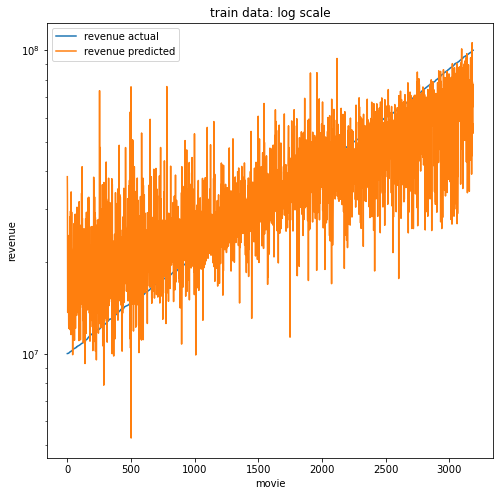

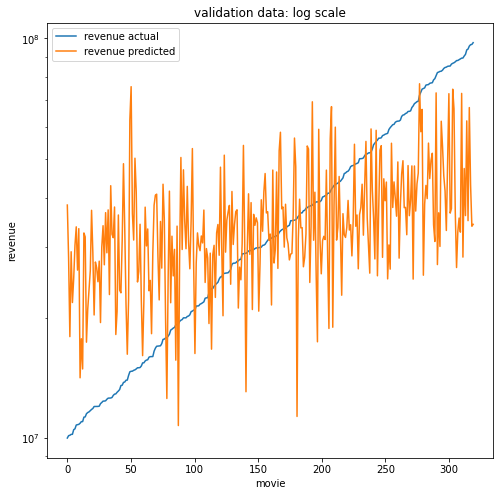

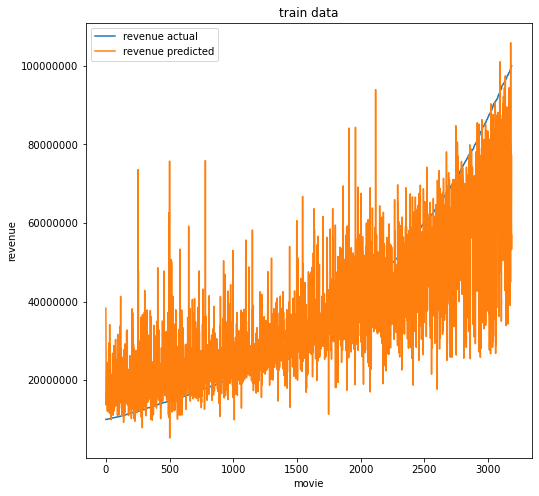

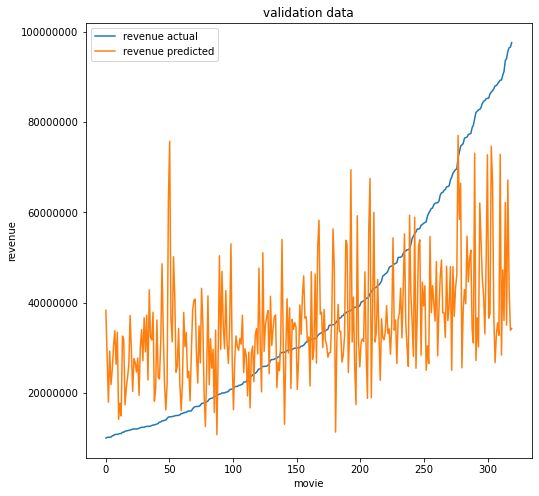

split 4
[LightGBM] [Warning] bagging_fraction is set=0.6675607273702425, subsample=0.14235451782817768 will be ignored. Current value: bagging_fraction=0.6675607273702425
[LightGBM] [Warning] min_sum_hessian_in_leaf is set=47, min_child_weight=0.3016919119420111 will be ignored. Current value: min_sum_hessian_in_leaf=47
[LightGBM] [Warning] min_data_in_leaf is set=28, min_child_samples=158 will be ignored. Current value: min_data_in_leaf=28
[LightGBM] [Warning] bagging_freq is set=70, subsample_freq=0 will be ignored. Current value: bagging_freq=70
[LightGBM] [Warning] feature_fraction is set=0.9386698820528618, colsample_bytree=0.3804265687037845 will be ignored. Current value: feature_fraction=0.9386698820528618
model fit time: 2.9880409240722656
train
smape: 34.133
mape: 40.868
wape: 31.841
mae: 12,369,906.000
rmse: 16,902,387.000
r2: 0.524
adj_r2: 0.487
test
smape: 47.942
mape: 62.444
wape: 46.977
mae: 17,496,597.000
rmse: 22,116,570.000
r2: 0.069
adj_r2: -2.289


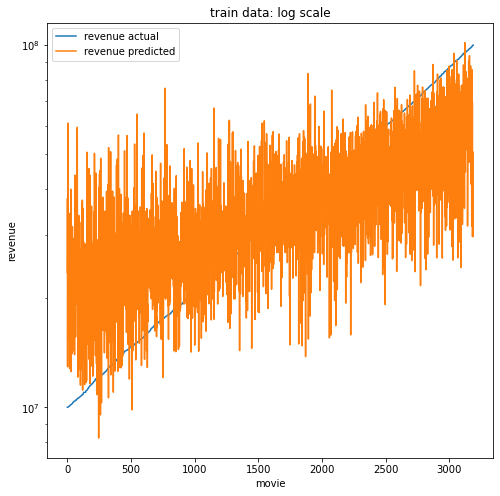

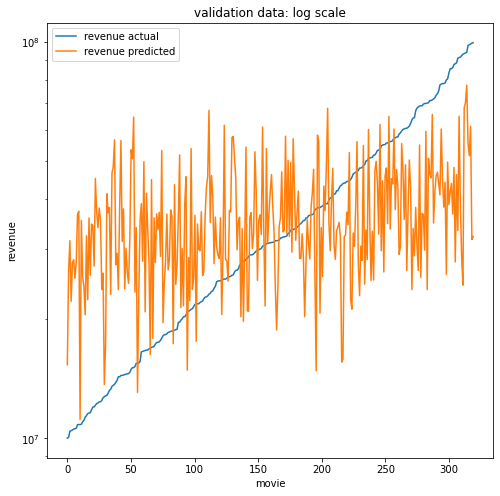

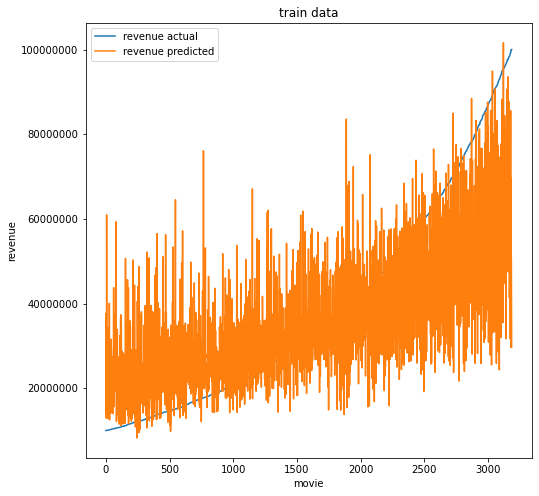

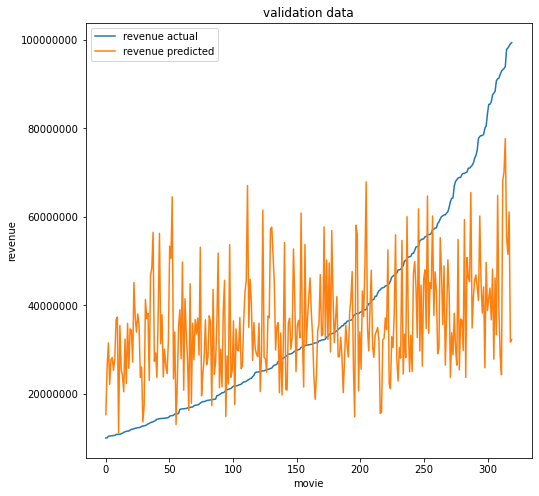

split 5
[LightGBM] [Warning] bagging_fraction is set=0.6675607273702425, subsample=0.14235451782817768 will be ignored. Current value: bagging_fraction=0.6675607273702425
[LightGBM] [Warning] min_sum_hessian_in_leaf is set=47, min_child_weight=0.3016919119420111 will be ignored. Current value: min_sum_hessian_in_leaf=47
[LightGBM] [Warning] min_data_in_leaf is set=28, min_child_samples=158 will be ignored. Current value: min_data_in_leaf=28
[LightGBM] [Warning] bagging_freq is set=70, subsample_freq=0 will be ignored. Current value: bagging_freq=70
[LightGBM] [Warning] feature_fraction is set=0.9386698820528618, colsample_bytree=0.3804265687037845 will be ignored. Current value: feature_fraction=0.9386698820528618
model fit time: 1.731090784072876
train
smape: 36.384
mape: 42.245
wape: 34.152
mae: 13,267,816.000
rmse: 18,034,340.000
r2: 0.458
adj_r2: 0.416
test
smape: 52.623
mape: 64.289
wape: 49.009
mae: 19,999,405.000
rmse: 25,128,591.000
r2: 0.127
adj_r2: -2.086


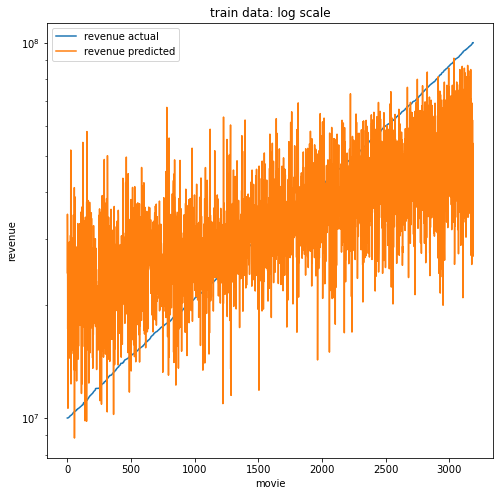

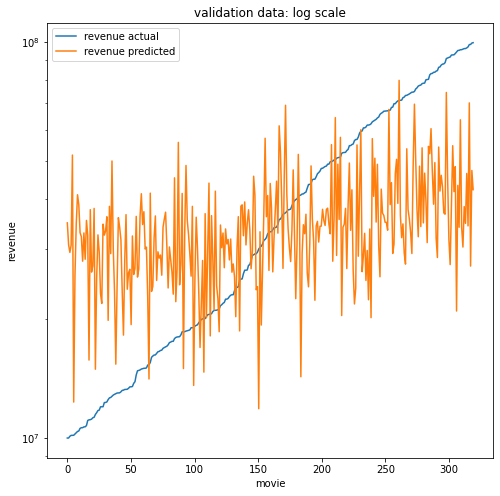

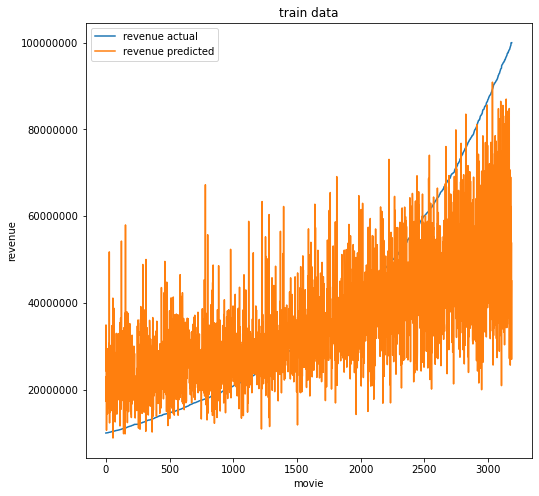

KeyboardInterrupt: 

In [66]:
params = dict(
    metrics=['mae', 'mape'],
    tree_learner='feature',
    # boosting='dart',
    verbose=-1,
    n_jobs=-1,
    objective='mse',
    reg_lambda=36.635816162104035,
    num_leaves=114,
    max_depth=15,
    max_bin=5000,
    min_data_in_leaf=28,
    min_child_samples=158,
    bagging_freq=70,
    n_estimators=20000,
    min_sum_hessian_in_leaf=47,
    learning_rate=0.2,
    feature_fraction=0.9386698820528618,
    bagging_fraction=0.6675607273702425,
    subsample=0.14235451782817768,
    min_child_weight=0.3016919119420111,
    colsample_bytree=0.3804265687037845,
    early_stopping_round=30,
    extra_trees=True,
)

cv_result = get_regression_cv_metrics(create_and_fit_lgb_regressor_with_params, Xx, yy, 
    n_splits=10, patience=10
    , validation_size=0.1, should_output_metrics=True, should_output_graphs=True, model_params=params)

split 1
[LightGBM] [Warning] bagging_fraction is set=0.6675607273702425, subsample=0.14235451782817768 will be ignored. Current value: bagging_fraction=0.6675607273702425
[LightGBM] [Warning] min_sum_hessian_in_leaf is set=47, min_child_weight=0.3016919119420111 will be ignored. Current value: min_sum_hessian_in_leaf=47
[LightGBM] [Warning] min_data_in_leaf is set=28, min_child_samples=158 will be ignored. Current value: min_data_in_leaf=28
[LightGBM] [Warning] bagging_freq is set=70, subsample_freq=0 will be ignored. Current value: bagging_freq=70
[LightGBM] [Warning] feature_fraction is set=0.9386698820528618, colsample_bytree=0.3804265687037845 will be ignored. Current value: feature_fraction=0.9386698820528618
model fit time: 2.44380259513855
train
smape: 29.649
mape: 33.315
wape: 28.823
mae: 11,197,536.000
rmse: 16,548,180.000
r2: 0.543
adj_r2: 0.508
test
smape: 35.284
mape: 38.426
wape: 33.846
mae: 12,822,179.000
rmse: 17,412,108.000
r2: 0.440
adj_r2: -0.978


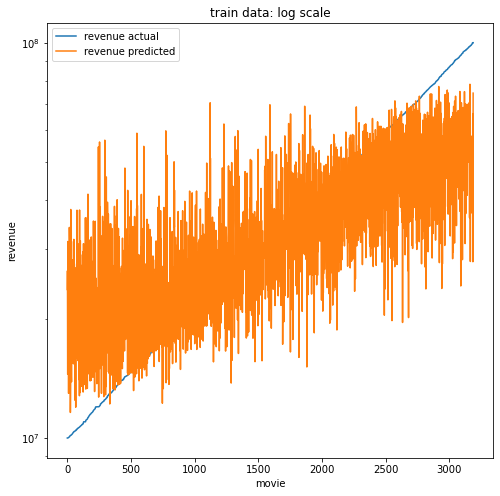

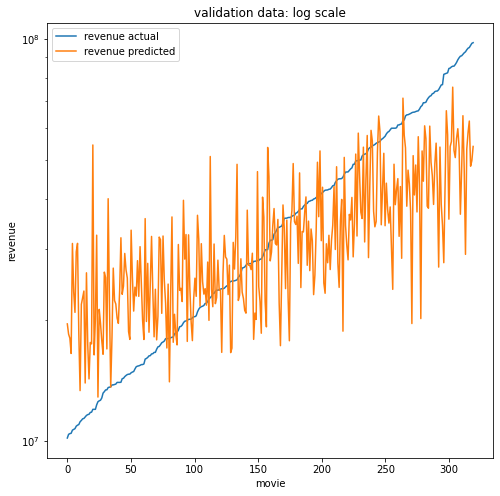

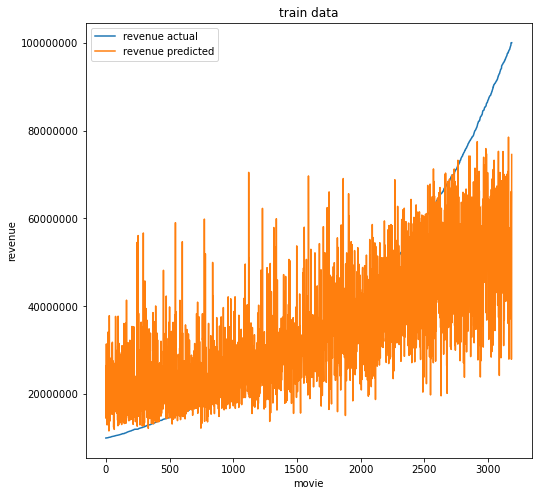

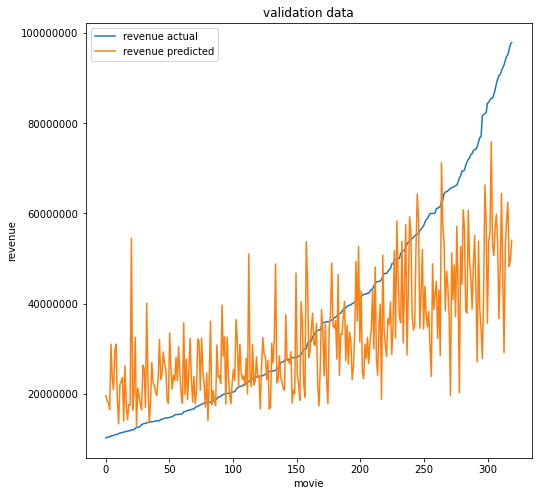

split 2
[LightGBM] [Warning] bagging_fraction is set=0.6675607273702425, subsample=0.14235451782817768 will be ignored. Current value: bagging_fraction=0.6675607273702425
[LightGBM] [Warning] min_sum_hessian_in_leaf is set=47, min_child_weight=0.3016919119420111 will be ignored. Current value: min_sum_hessian_in_leaf=47
[LightGBM] [Warning] min_data_in_leaf is set=28, min_child_samples=158 will be ignored. Current value: min_data_in_leaf=28
[LightGBM] [Warning] bagging_freq is set=70, subsample_freq=0 will be ignored. Current value: bagging_freq=70
[LightGBM] [Warning] feature_fraction is set=0.9386698820528618, colsample_bytree=0.3804265687037845 will be ignored. Current value: feature_fraction=0.9386698820528618
model fit time: 2.1907286643981934
train
smape: 29.303
mape: 32.857
wape: 28.560
mae: 11,095,277.000
rmse: 16,551,279.000
r2: 0.543
adj_r2: 0.508
test
smape: 38.218
mape: 41.885
wape: 37.172
mae: 14,518,807.000
rmse: 19,869,780.000
r2: 0.370
adj_r2: -1.225


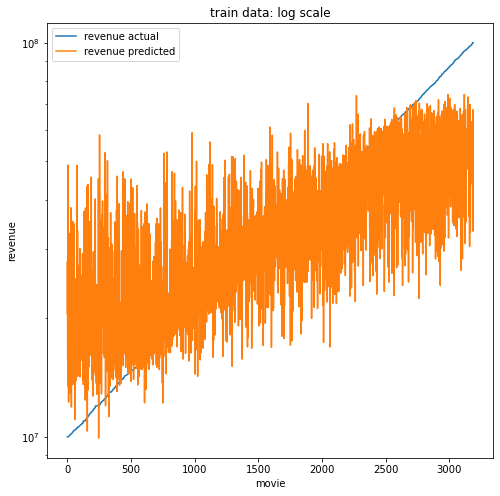

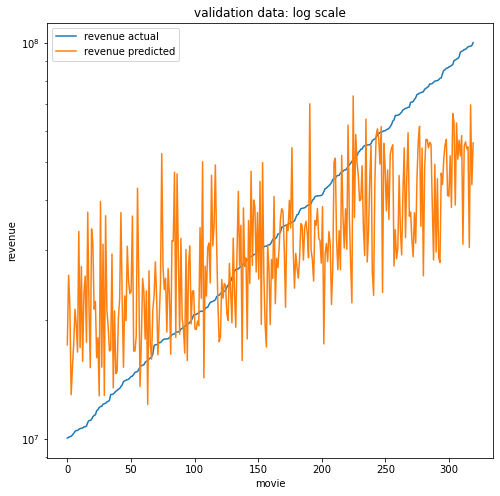

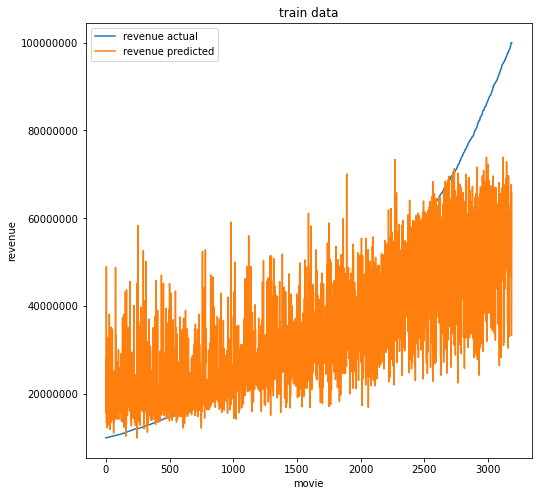

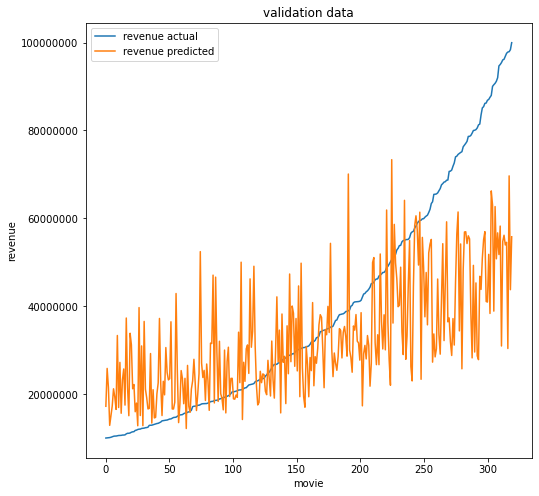

split 3
[LightGBM] [Warning] bagging_fraction is set=0.6675607273702425, subsample=0.14235451782817768 will be ignored. Current value: bagging_fraction=0.6675607273702425
[LightGBM] [Warning] min_sum_hessian_in_leaf is set=47, min_child_weight=0.3016919119420111 will be ignored. Current value: min_sum_hessian_in_leaf=47
[LightGBM] [Warning] min_data_in_leaf is set=28, min_child_samples=158 will be ignored. Current value: min_data_in_leaf=28
[LightGBM] [Warning] bagging_freq is set=70, subsample_freq=0 will be ignored. Current value: bagging_freq=70
[LightGBM] [Warning] feature_fraction is set=0.9386698820528618, colsample_bytree=0.3804265687037845 will be ignored. Current value: feature_fraction=0.9386698820528618
model fit time: 2.627516508102417
train
smape: 22.885
mape: 25.549
wape: 22.535
mae: 8,754,780.000
rmse: 14,102,214.000
r2: 0.668
adj_r2: 0.643
test
smape: 35.114
mape: 39.044
wape: 33.385
mae: 12,769,616.000
rmse: 16,971,965.000
r2: 0.496
adj_r2: -0.780


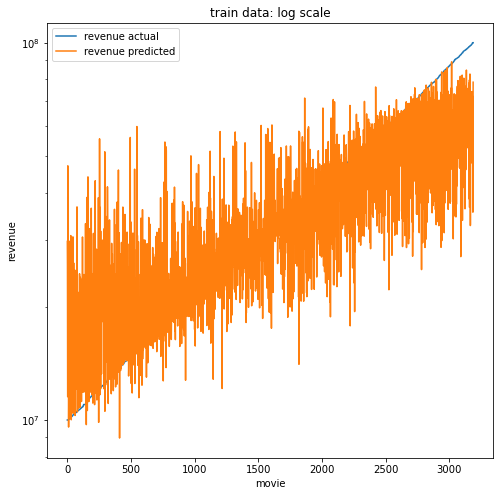

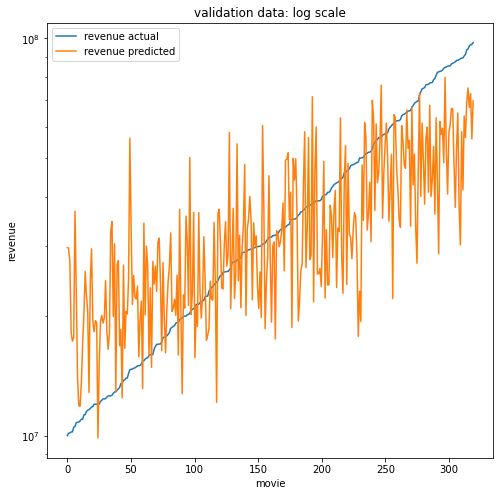

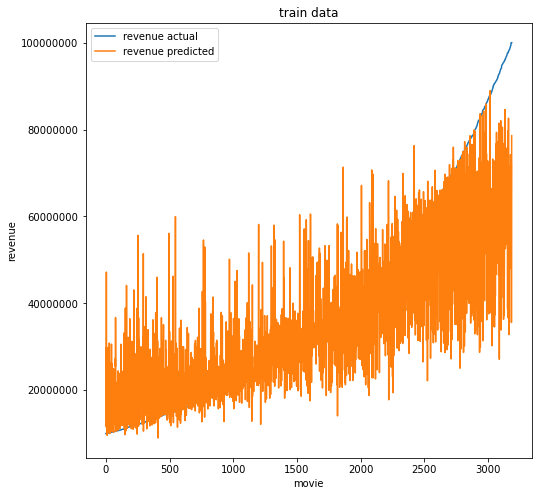

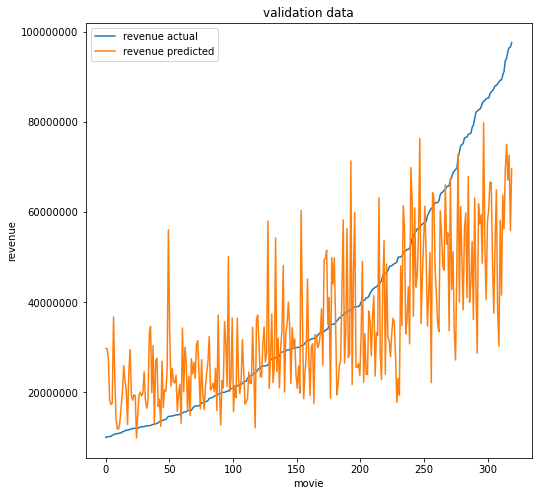

split 4
[LightGBM] [Warning] bagging_fraction is set=0.6675607273702425, subsample=0.14235451782817768 will be ignored. Current value: bagging_fraction=0.6675607273702425
[LightGBM] [Warning] min_sum_hessian_in_leaf is set=47, min_child_weight=0.3016919119420111 will be ignored. Current value: min_sum_hessian_in_leaf=47
[LightGBM] [Warning] min_data_in_leaf is set=28, min_child_samples=158 will be ignored. Current value: min_data_in_leaf=28
[LightGBM] [Warning] bagging_freq is set=70, subsample_freq=0 will be ignored. Current value: bagging_freq=70
[LightGBM] [Warning] feature_fraction is set=0.9386698820528618, colsample_bytree=0.3804265687037845 will be ignored. Current value: feature_fraction=0.9386698820528618
model fit time: 2.03631591796875
train
smape: 23.671
mape: 26.997
wape: 23.037
mae: 8,949,581.000
rmse: 14,137,879.000
r2: 0.667
adj_r2: 0.641
test
smape: 36.912
mape: 44.477
wape: 35.640
mae: 13,274,058.000
rmse: 17,599,562.000
r2: 0.411
adj_r2: -1.083


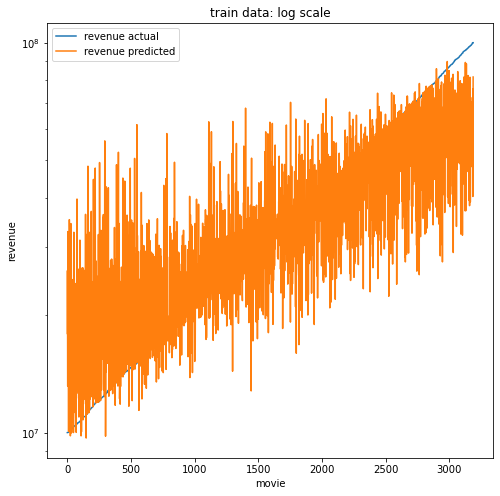

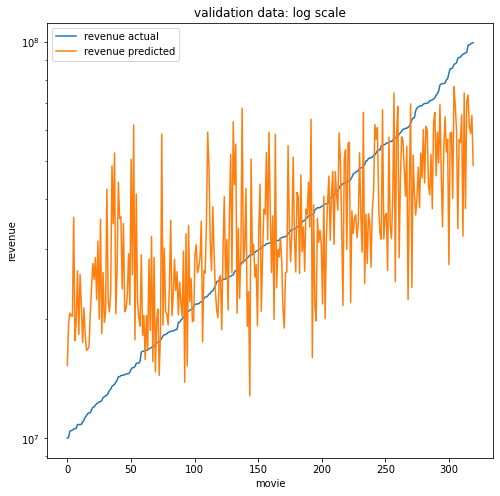

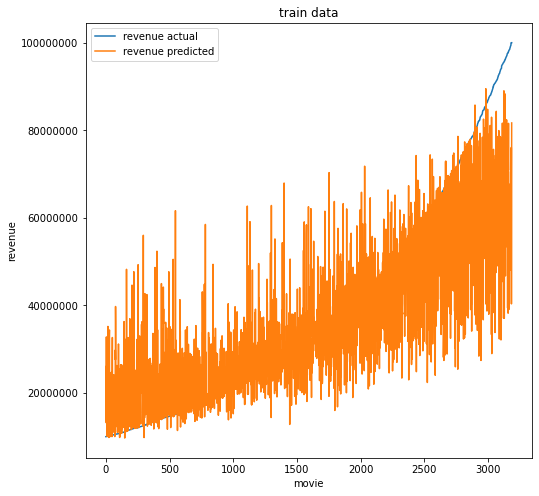

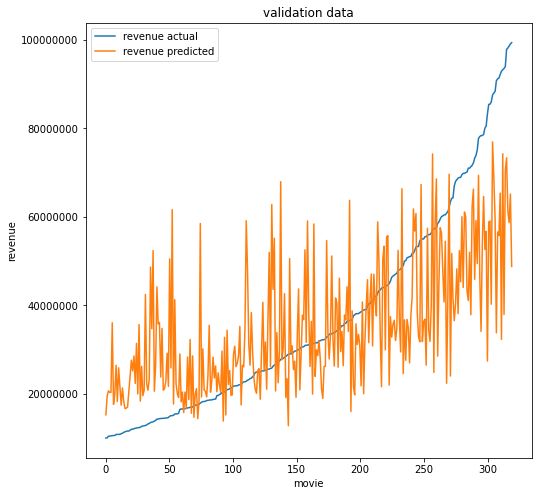

split 5
[LightGBM] [Warning] bagging_fraction is set=0.6675607273702425, subsample=0.14235451782817768 will be ignored. Current value: bagging_fraction=0.6675607273702425
[LightGBM] [Warning] min_sum_hessian_in_leaf is set=47, min_child_weight=0.3016919119420111 will be ignored. Current value: min_sum_hessian_in_leaf=47
[LightGBM] [Warning] min_data_in_leaf is set=28, min_child_samples=158 will be ignored. Current value: min_data_in_leaf=28
[LightGBM] [Warning] bagging_freq is set=70, subsample_freq=0 will be ignored. Current value: bagging_freq=70
[LightGBM] [Warning] feature_fraction is set=0.9386698820528618, colsample_bytree=0.3804265687037845 will be ignored. Current value: feature_fraction=0.9386698820528618
model fit time: 2.7658843994140625
train
smape: 25.848
mape: 29.767
wape: 24.939
mae: 9,688,699.000
rmse: 14,804,915.000
r2: 0.635
adj_r2: 0.606
test
smape: 36.406
mape: 42.714
wape: 33.524
mae: 13,680,262.000
rmse: 18,211,180.000
r2: 0.541
adj_r2: -0.621


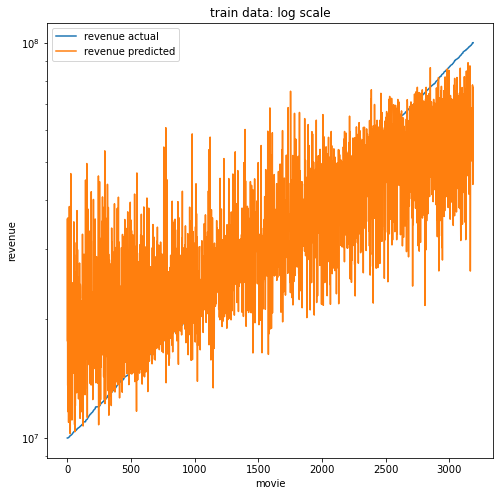

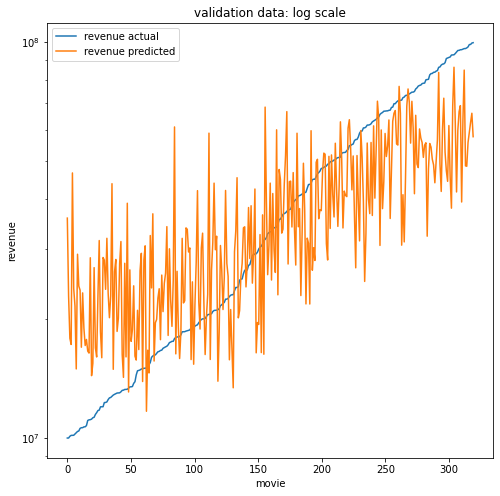

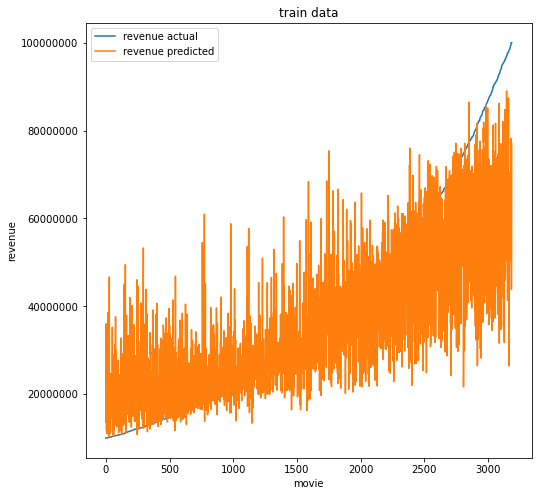

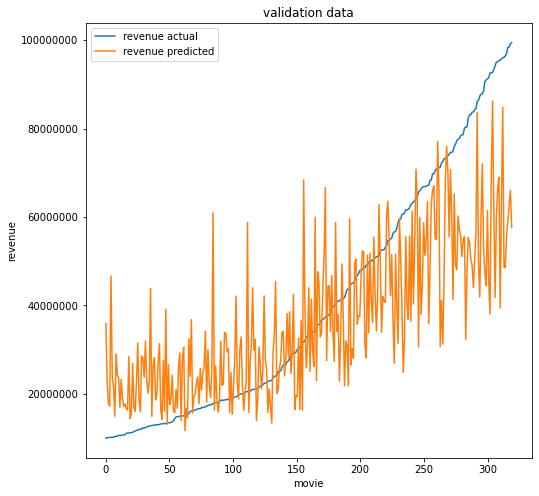

split 6
[LightGBM] [Warning] bagging_fraction is set=0.6675607273702425, subsample=0.14235451782817768 will be ignored. Current value: bagging_fraction=0.6675607273702425
[LightGBM] [Warning] min_sum_hessian_in_leaf is set=47, min_child_weight=0.3016919119420111 will be ignored. Current value: min_sum_hessian_in_leaf=47
[LightGBM] [Warning] min_data_in_leaf is set=28, min_child_samples=158 will be ignored. Current value: min_data_in_leaf=28
[LightGBM] [Warning] bagging_freq is set=70, subsample_freq=0 will be ignored. Current value: bagging_freq=70
[LightGBM] [Warning] feature_fraction is set=0.9386698820528618, colsample_bytree=0.3804265687037845 will be ignored. Current value: feature_fraction=0.9386698820528618
model fit time: 2.7196614742279053
train
smape: 23.771
mape: 26.894
wape: 23.190
mae: 9,009,063.000
rmse: 14,255,564.000
r2: 0.661
adj_r2: 0.635
test
smape: 34.875
mape: 39.497
wape: 32.358
mae: 13,045,088.000
rmse: 17,003,046.000
r2: 0.527
adj_r2: -0.673


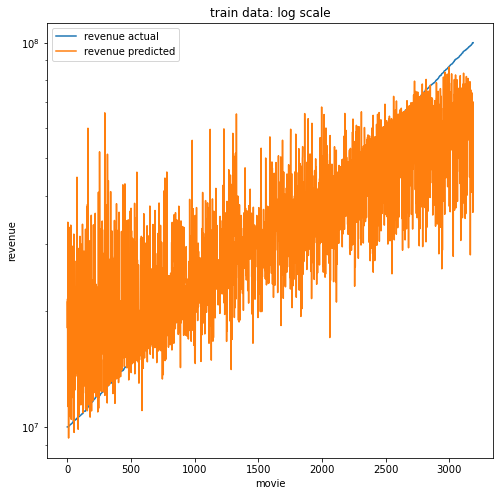

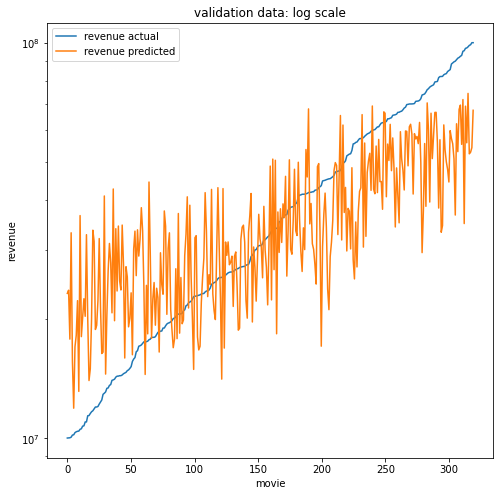

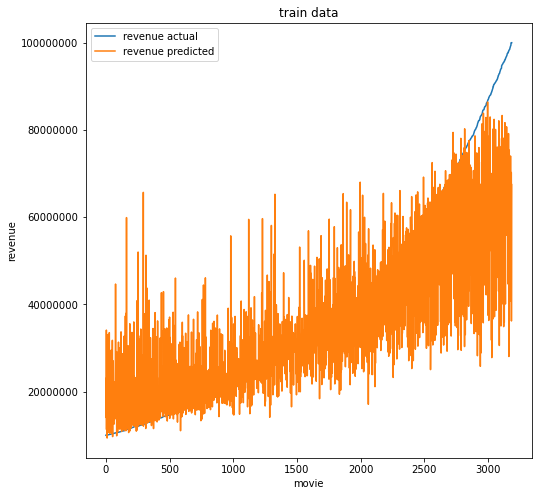

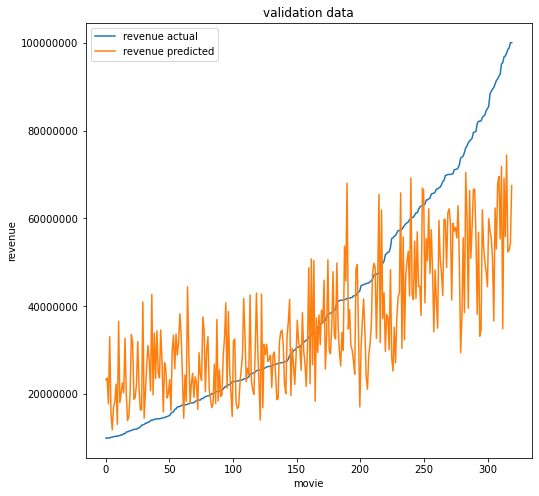

split 7
[LightGBM] [Warning] bagging_fraction is set=0.6675607273702425, subsample=0.14235451782817768 will be ignored. Current value: bagging_fraction=0.6675607273702425
[LightGBM] [Warning] min_sum_hessian_in_leaf is set=47, min_child_weight=0.3016919119420111 will be ignored. Current value: min_sum_hessian_in_leaf=47
[LightGBM] [Warning] min_data_in_leaf is set=28, min_child_samples=158 will be ignored. Current value: min_data_in_leaf=28
[LightGBM] [Warning] bagging_freq is set=70, subsample_freq=0 will be ignored. Current value: bagging_freq=70
[LightGBM] [Warning] feature_fraction is set=0.9386698820528618, colsample_bytree=0.3804265687037845 will be ignored. Current value: feature_fraction=0.9386698820528618
model fit time: 3.1624999046325684
train
smape: 27.225
mape: 31.084
wape: 26.276
mae: 10,208,085.000
rmse: 15,368,251.000
r2: 0.606
adj_r2: 0.576
test
smape: 37.685
mape: 44.557
wape: 36.164
mae: 13,926,252.000
rmse: 18,995,534.000
r2: 0.369
adj_r2: -1.249


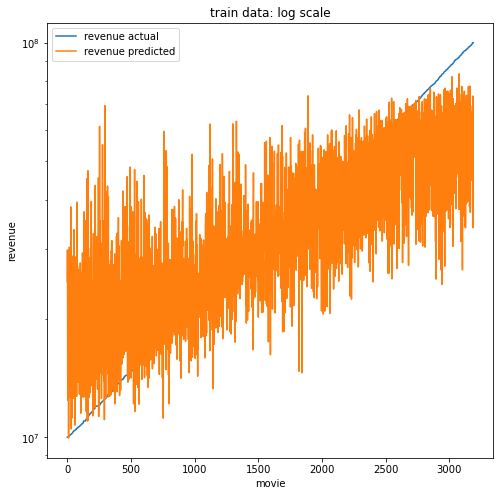

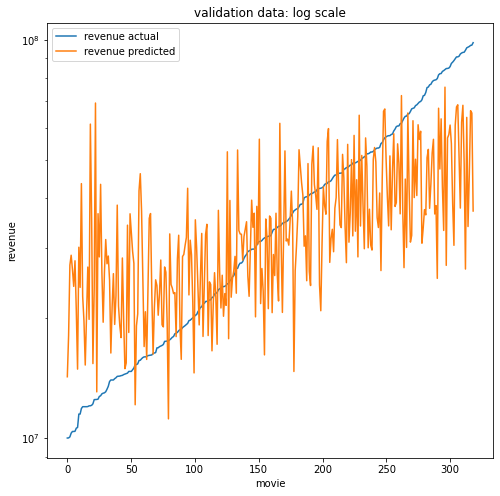

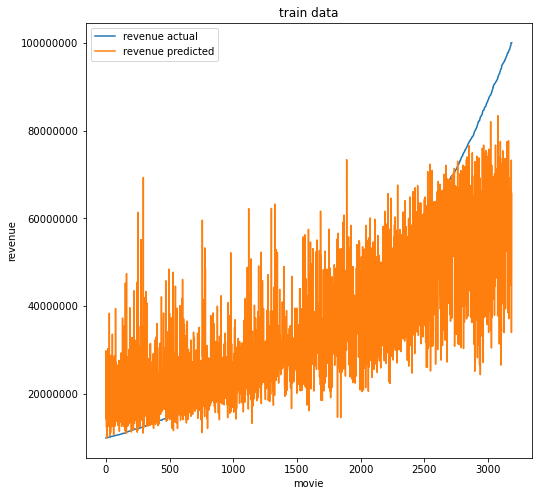

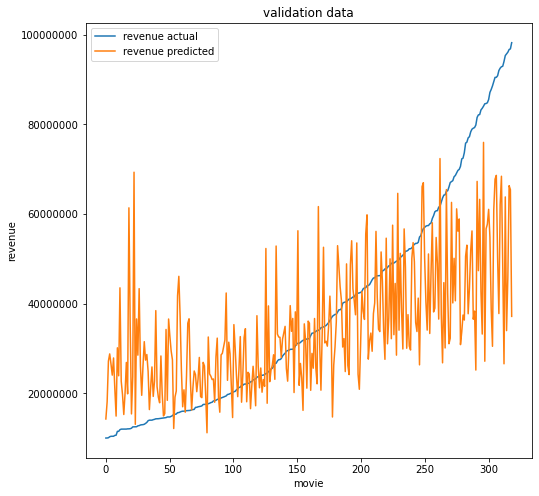

split 8
[LightGBM] [Warning] bagging_fraction is set=0.6675607273702425, subsample=0.14235451782817768 will be ignored. Current value: bagging_fraction=0.6675607273702425
[LightGBM] [Warning] min_sum_hessian_in_leaf is set=47, min_child_weight=0.3016919119420111 will be ignored. Current value: min_sum_hessian_in_leaf=47
[LightGBM] [Warning] min_data_in_leaf is set=28, min_child_samples=158 will be ignored. Current value: min_data_in_leaf=28
[LightGBM] [Warning] bagging_freq is set=70, subsample_freq=0 will be ignored. Current value: bagging_freq=70
[LightGBM] [Warning] feature_fraction is set=0.9386698820528618, colsample_bytree=0.3804265687037845 will be ignored. Current value: feature_fraction=0.9386698820528618
model fit time: 4.435450077056885
train
smape: 23.552
mape: 26.476
wape: 23.180
mae: 9,005,218.000
rmse: 14,503,353.000
r2: 0.649
adj_r2: 0.622
test
smape: 36.177
mape: 41.531
wape: 33.649
mae: 13,189,727.000
rmse: 17,778,079.000
r2: 0.490
adj_r2: -0.817


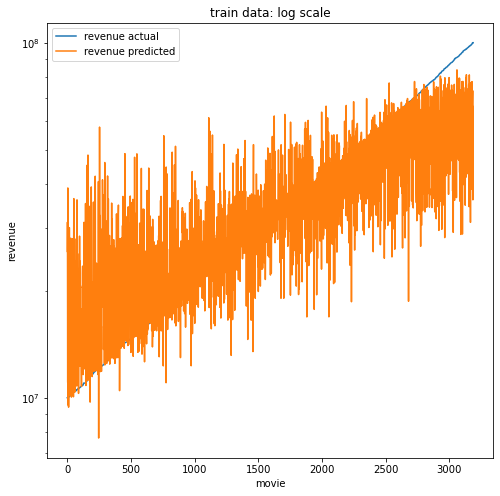

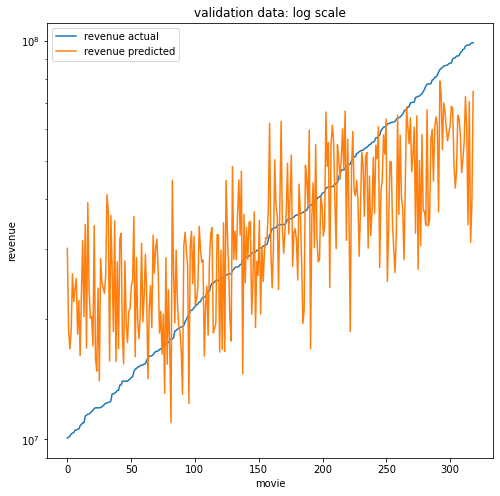

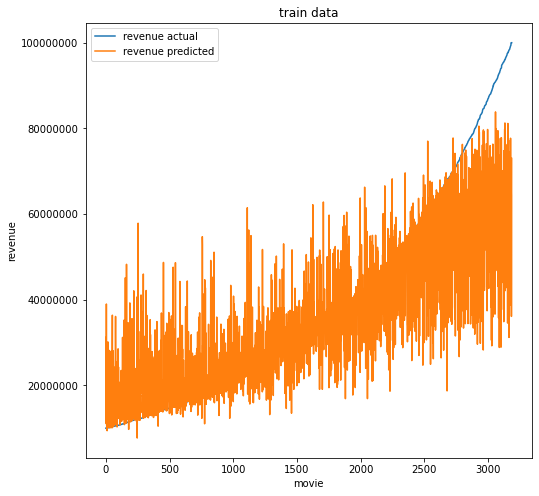

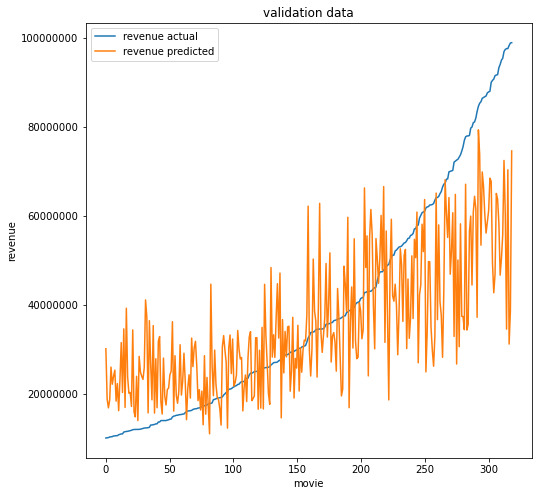

split 9
[LightGBM] [Warning] bagging_fraction is set=0.6675607273702425, subsample=0.14235451782817768 will be ignored. Current value: bagging_fraction=0.6675607273702425
[LightGBM] [Warning] min_sum_hessian_in_leaf is set=47, min_child_weight=0.3016919119420111 will be ignored. Current value: min_sum_hessian_in_leaf=47
[LightGBM] [Warning] min_data_in_leaf is set=28, min_child_samples=158 will be ignored. Current value: min_data_in_leaf=28
[LightGBM] [Warning] bagging_freq is set=70, subsample_freq=0 will be ignored. Current value: bagging_freq=70
[LightGBM] [Warning] feature_fraction is set=0.9386698820528618, colsample_bytree=0.3804265687037845 will be ignored. Current value: feature_fraction=0.9386698820528618
model fit time: 3.5246589183807373
train
smape: 26.116
mape: 29.376
wape: 25.561
mae: 9,930,166.000
rmse: 15,337,937.000
r2: 0.608
adj_r2: 0.578
test
smape: 36.544
mape: 41.008
wape: 35.616
mae: 14,051,639.000
rmse: 18,878,982.000
r2: 0.401
adj_r2: -1.134


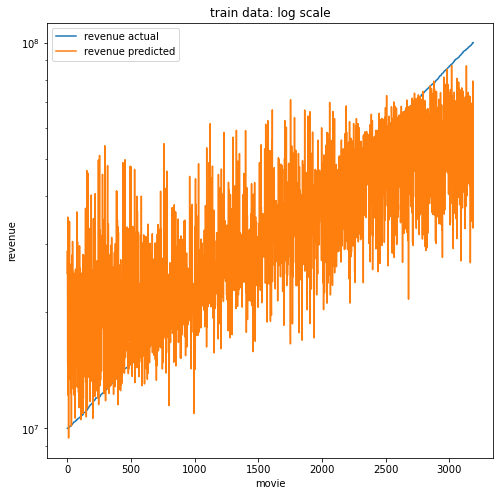

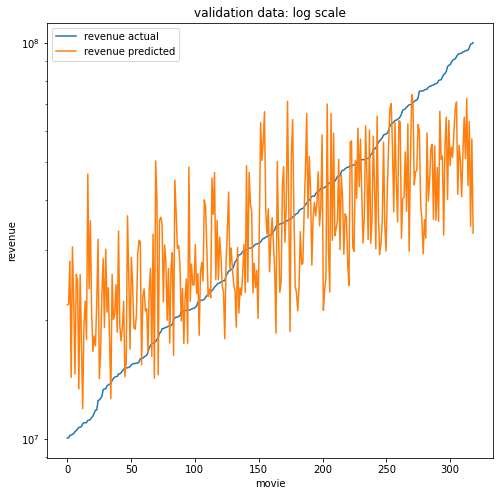

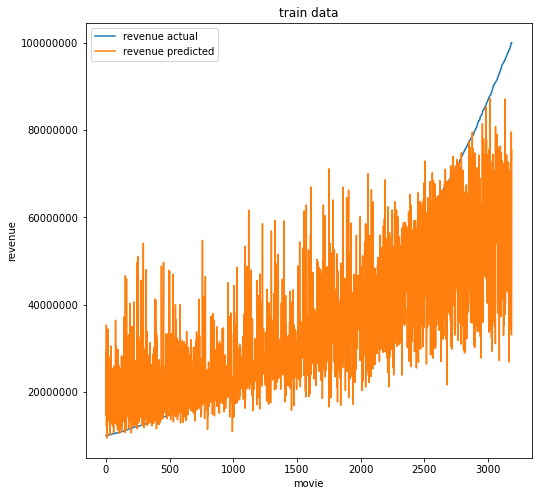

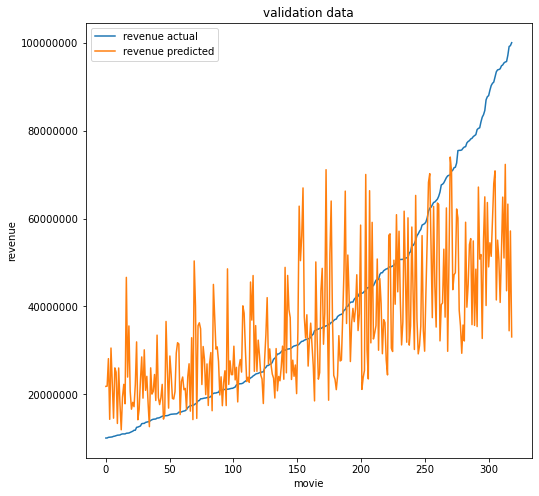

split 10
[LightGBM] [Warning] bagging_fraction is set=0.6675607273702425, subsample=0.14235451782817768 will be ignored. Current value: bagging_fraction=0.6675607273702425
[LightGBM] [Warning] min_sum_hessian_in_leaf is set=47, min_child_weight=0.3016919119420111 will be ignored. Current value: min_sum_hessian_in_leaf=47
[LightGBM] [Warning] min_data_in_leaf is set=28, min_child_samples=158 will be ignored. Current value: min_data_in_leaf=28
[LightGBM] [Warning] bagging_freq is set=70, subsample_freq=0 will be ignored. Current value: bagging_freq=70
[LightGBM] [Warning] feature_fraction is set=0.9386698820528618, colsample_bytree=0.3804265687037845 will be ignored. Current value: feature_fraction=0.9386698820528618
model fit time: 2.863525629043579
train
smape: 27.861
mape: 31.380
wape: 27.082
mae: 10,521,193.000
rmse: 15,830,905.000
r2: 0.582
adj_r2: 0.550
test
smape: 35.597
mape: 43.008
wape: 34.416
mae: 13,000,636.000
rmse: 17,821,833.000
r2: 0.472
adj_r2: -0.882


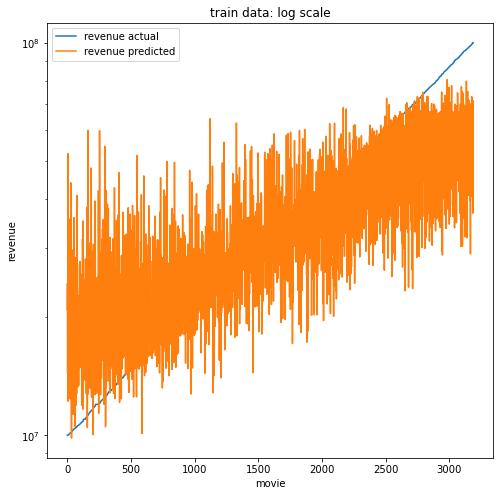

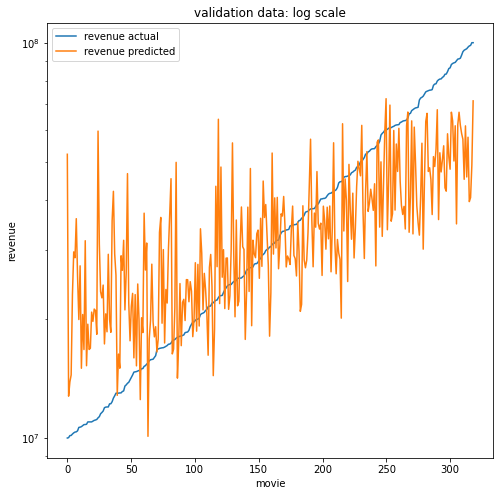

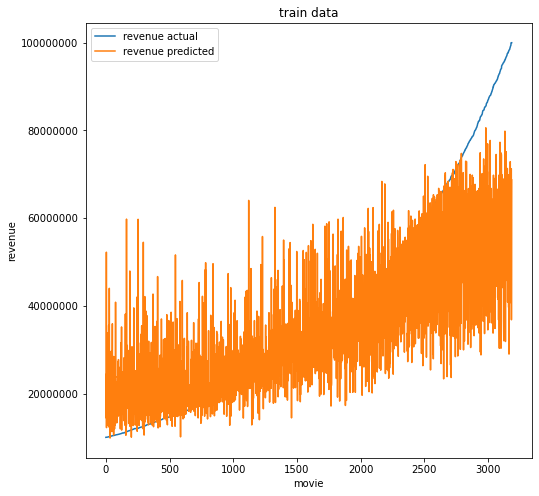

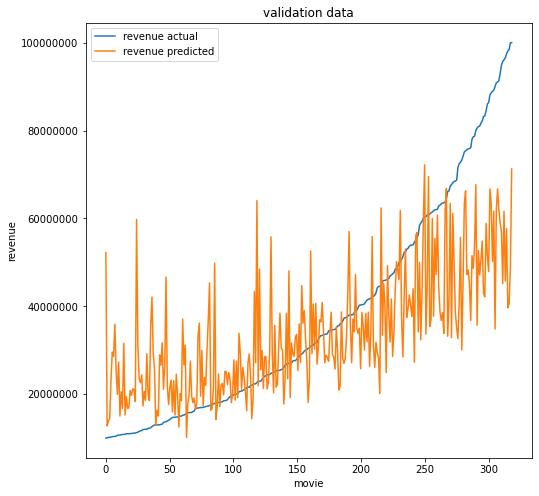

{'smape': 36.2811983597259, 'wape': 34.57699530997558, 'mape': 41.614865200915816, 'mae': 13427826.4, 'rmse': 18054206.9, 'r2': 0.4515962422886581, 'adj_r2': -0.9441519553250449}
10 CV time: 47.107309103012085


In [142]:
params = dict(
    metrics=['mae', 'mape'],
    tree_learner='feature',
    verbose=-1,
    n_jobs=-1,
    objective='mape',
    reg_lambda=36.635816162104035,
    num_leaves=114,
    max_depth=15,
    min_data_in_leaf=28,
    min_child_samples=158,
    bagging_freq=70,params = dict(
    metrics=['mae', 'mape'],
    tree_learner='feature',    reg_alpha=0.0,
    verbose=-1,    reg_alpha=0.0,
    n_jobs=-1,    reg_alpha=0.0,
    objective='mape',
    reg_lambda=36.635816162104035,
    num_leaves=114,
    max_depth=15,
    min_data_in_leaf=28,
…    reg_alpha=0.0,
)

cv_result = get_regression_cv_metrics(create_and_fit_lgb_regressor_with_params, Xx, yy, 
    n_splits=10, patience=50
    , validation_size=0.05, should_output_metrics=True, should_output_graphs=True, model_params=params)
    n_estimators=13987,
    min_sum_hessian_in_leaf=47,
    learning_rate=0.08807093062797279,
    feature_fraction=0.9386698820528618,
    bagging_fraction=0.6675607273702425,
    subsample=0.14235451782817768,
    min_child_weight=0.3016919119420111,
    colsample_bytree=0.3804265687037845,
    reg_alpha=0.0,
)

cv_result = get_regression_cv_metrics(create_and_fit_lgb_regressor_with_params, Xx, yy, 
    n_splits=10, patience=50
    , validation_size=0.05, should_output_metrics=True, should_output_graphs=True, model_params=params)

In [67]:
# Finetune with bayesian optimizer
def bayes_parameter_opt_lgb_regression(X, y, init_round=15, opt_round=30, n_folds=10, patience=30, validation_size=0.05, output_process=False):
    def model_eval(**params_raw):
        params = convert_lgb_params(params_raw)
        print(params)
        cv_result = get_regression_cv_metrics(create_and_fit_lgb_regressor_with_params, X, y, 
            n_splits=n_folds, patience=patience, validation_size=validation_size, model_params=params)
        return -cv_result['cv_metrics']['mape']

    # def model_eval(**params_raw):
    #     params, dataset = convert_lgb_params(params_raw), lgb.Dataset(data=X, label=y, free_raw_data=False)
    #     start = time.time()
    #     cv_result = lgb.cv(params, dataset, nfold=n_folds, seed=0, shuffle=True, early_stopping_rounds=patience, num_boost_round=2, verbose_eval=True)
    #     print(f'CV time: {time.time() - start}\n\n')
    #     return -max(cv_result['l1-mean'])

    pbounds = {
        'tree_learner': (0,3),
        'objective': (0, 5),
        'num_leaves': (10, 200),
        'learning_rate': (0.001, 1.0),
        'feature_fraction': (0.6, 1.0),
        'bagging_fraction': (0.1, 1),
        'max_bin': (1, 100),
        'max_depth': (0, 80),
        'min_data_in_leaf': (1, 80),
        'min_sum_hessian_in_leaf':(0,100),
        'subsample': (0.1, 1.0),
        'n_estimators': (1000, 20000),
        'min_child_samples': (1, 250),
        'min_child_weight': (0.1, 0.5),
        'bagging_freq': (1, 100),
        'colsample_bytree': (0.01, 1),
        'reg_alpha': (0, 1),
        'reg_lambda': (0, 100),
    }

    bounds_transformer = SequentialDomainReductionTransformer()
    optimizer = BayesianOptimization(
        f = model_eval, 
        pbounds = pbounds, 
        random_state=0,
        bounds_transformer=bounds_transformer,
    )
    optimizer.maximize(init_points=init_round, n_iter=opt_round)
    model_params=[]
    for model in range(len(optimizer.res)):
        model_params.append(optimizer.res[model]['target'])
    return {
        'target': optimizer.res[pd.Series(model_params).idxmax()]['target'], 
        'params': optimizer.res[pd.Series(model_params).idxmax()]['params'],
        'bounds_transformer': bounds_transformer,
        'optimizer': optimizer,
    }

In [68]:
%%time
opt_results = bayes_parameter_opt_lgb_regression(Xx, yy, init_round=2, opt_round=30, n_folds=10, patience=30)

|  52.58    |  0.7934   |  0.8031   |  0.4339   |  61.44    |  29.71    |  209.8    |  0.4373   |  34.73    |  52.14    |  9.894e+0 |  141.6    |  3.986    |  0.04216  |  3.773    |  0.1466   |  2.068    |
{'metrics': ['mae', 'mape'], 'tree_learner': 'data', 'verbose': -1, 'n_jobs': -1, 'objective': 'mape', 'reg_lambda': 16.258950577149427, 'num_leaves': 150, 'max_depth': 17, 'min_data_in_leaf': 14, 'min_child_samples': 229, 'bagging_freq': 65, 'n_estimators': 10304, 'min_sum_hessian_in_leaf': 70, 'learning_rate': 0.23619101560091607, 'feature_fraction': 0.9235716853648319, 'bagging_fraction': 0.7576490071330318, 'subsample': 0.10437791372626638, 'min_child_weight': 0.46774272842197084, 'colsample_bytree': 0.7673968740431922, 'reg_alpha': 0.03839723119821004}
split 1
[LightGBM] [Warning] bagging_fraction is set=0.7576490071330318, subsample=0.10437791372626638 will be ignored. Current value: bagging_fraction=0.7576490071330318
[LightGBM] [Warning] min_sum_hessian_in_leaf is set=70, min

KeyboardInterrupt: 

In [ ]:
%%time
opt_results = bayes_parameter_opt_lgb_regression(X, y, init_round=30, opt_round=100, n_folds=10, patience=30)

In [141]:
print_formatted_params(opt_results['params'])

metrics='['mae', 'mape']',
tree_learner='feature',
verbose=-1,
n_jobs=-1,
objective='mape',
reg_lambda=36.635816162104035,
num_leaves=114,
max_depth=15,
min_data_in_leaf=28,
min_child_samples=158,
bagging_freq=70,
n_estimators=13987,
min_sum_hessian_in_leaf=47,
learning_rate=0.08807093062797279,
feature_fraction=0.9386698820528618,
bagging_fraction=0.6675607273702425,
subsample=0.14235451782817768,
min_child_weight=0.3016919119420111,
colsample_bytree=0.3804265687037845,
reg_alpha=0.0,


In [10]:
# Finetune with hyperopt
from hyperopt import Trials, STATUS_OK, tpe, rand
from hyperas import optim
from hyperas.distributions import choice, uniform

def get_data():
    with open(f'outliers/final/nan_filled_data.pickle', 'rb') as handle:
        data = pickle.load(handle)
    X_train, y_train, X_val, y_val, X_test, y_test = data['X_train'], data['y_train'], data['X_val'], data['y_val'], data['X_test'], data['y_test']
    X = pd.concat([X_train, X_test, X_val])
    y = np.concatenate([y_train, y_test, y_val])
    return X, y

def get_lgb_hyperas_model(X, y):
    objective={{uniform(0, 5)}}
    num_leaves={{uniform(10, 150)}}
    learning_rate={{uniform(0.005, 1.0)}}
    feature_fraction={{uniform(0.6, 1.0)}}
    bagging_fraction={{uniform(0.75, 1)}}
    max_depth={{uniform(0, 80)}}
    min_data_in_leaf={{uniform(1, 80)}}
    min_sum_hessian_in_leaf={{uniform(0,100)}}
    subsample={{uniform(0.1, 1.0)}}
    n_estimators={{uniform(1000, 20000)}}
    min_child_samples={{uniform(1, 250)}}
    min_child_weight={{uniform(0.1, 0.5)}}
    bagging_freq={{uniform(1, 100)}}
    colsample_bytree={{uniform(0.01, 1)}}
    reg_alpha={{uniform(0, 1)}}
    reg_lambda={{uniform(0, 100)}}
    
    params_raw = {
        'objective': objective,
        'num_leaves': num_leaves,
        'learning_rate': learning_rate,
        'feature_fraction': feature_fraction,
        'bagging_fraction': bagging_fraction,
        'max_depth': max_depth,
        'min_data_in_leaf': min_data_in_leaf,
        'min_sum_hessian_in_leaf': min_sum_hessian_in_leaf,
        'subsample': subsample,
        'n_estimators': n_estimators,
        'min_child_samples': min_child_samples,
        'min_child_weight': min_child_weight,
        'bagging_freq': bagging_freq,
        'colsample_bytree': colsample_bytree,
        'reg_alpha': reg_alpha,
        'reg_lambda': reg_lambda,
    }
    params = convert_lgb_params(params_raw)
    print(params)
    cv_result = get_regression_cv_metrics(create_and_fit_lgb_regressor_with_params, X, y, 
            n_splits=10, patience=30, validation_size=0.05, regressor_params=params)
    return {'loss': cv_result['cv_metrics']['smape'], 'status': STATUS_OK} 

In [13]:
best_run = None
best_model = None
space = None
trials=Trials()
best_run, best_model, space = optim.minimize(model=get_lgb_hyperas_model,
                                      data=get_data,
                                      algo=tpe.suggest,
                                      max_evals=30,
                                      trials=trials,
                                      notebook_name='regression_lgm',
                                      eval_space=True,
                                      return_space=True,
                                      functions=[convert_lgb_params, get_regression_cv_metrics, create_and_fit_lgb_regressor_with_params])

>>> Imports:
#coding=utf-8

try:
    import pickle
except:
    pass

try:
    import pandas as pd
except:
    pass

try:
    import numpy as np
except:
    pass

try:
    import lightgbm as lgb
except:
    pass

try:
    import time
except:
    pass

try:
    from sklearn.pipeline import Pipeline
except:
    pass

try:
    from sklearn.preprocessing import PowerTransformer
except:
    pass

try:
    from sklearn.compose import TransformedTargetRegressor
except:
    pass

try:
    from bayes_opt import BayesianOptimization, SequentialDomainReductionTransformer
except:
    pass

try:
    from importlib import reload
except:
    pass

try:
    import run_models, output, process_df
except:
    pass

try:
    from run_models import create_and_fit_regression_rf, create_and_fit_regression_lgb, create_and_fit_regression_nn, create_regression_lgb, build_nn_model, get_regression_cv_metrics, get_regression_cv_predictions
except:
    pass

try:
    from output import output_metrics, print_train_hi

NameError: name 'KFold' is not defined

In [65]:
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline

def create_and_fit_lgb_regressor_with_params(X, y, X_val, y_val, patience=30, regressor_params=None, verbose=-1):
    start = time.time()
    model = TransformedTargetRegressor(
        Pipeline([
            ('powertransform', PowerTransformer()),
            ('model', lgb.LGBMRegressor(**regressor_params)),
        ]),
        make_pipeline(
            StandardScaler(with_std=False),
            PowerTransformer(standardize=True),
        ),
    ).fit(X.values, y,
        model__verbose=verbose,
        model__eval_set=(X_val.values, y_val),
        model__early_stopping_rounds=patience,
        model__eval_metric='mean_absolute_error',
    )
    end = time.time()
    print(f'model fit time: {end - start}')
    return model

def create_regression_lgb():
    return lgb.LGBMRegressor(
        tree_learner='data',
        verbose=-1,
        n_jobs=-1,
        objective='mse',
        # max_bin=1000,
        reg_lambda=0.435,
        num_leaves=98,
        max_depth=52,
        min_data_in_leaf=20,
        # min_child_samples=4,
        bagging_freq=3,
        n_estimators=7149,
        min_sum_hessian_in_leaf=47,
        learning_rate=0.018,
        feature_fraction=0.665,
        bagging_fraction=0.8,
        # subsample=0.231,
        # min_child_weight=0.148,
        # colsample_bytree=0.984,
        reg_alpha=0.617,
    )

def create_and_fit_lgb_regressor(X, y, X_val, y_val, patience=30, regressor_params={}, verbose=-1):
    start = time.time()
    model = TransformedTargetRegressor(
        Pipeline([
            ('imputer', KNNImputer(n_neighbors=30, weights='distance')),
            ('powertransform', PowerTransformer()),
            ('model', create_regression_lgb()),
        ]),
        make_pipeline(
            # StandardScaler(with_std=False),
            PowerTransformer(standardize=True),
        ),
    ).fit(X.values, y,
        model__verbose=verbose,
        model__eval_set=(X_val.values, y_val),
        model__early_stopping_rounds=patience,
        model__eval_metric='mean_absolute_error',
    )

    end = time.time()
    print(f'model fit time: {end - start}')
    return model

In [30]:
%%time
test_true, test_pred = get_regression_cv_predictions(create_and_fit_lgb_regressor, X, y, patience=5)

split 1
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] min_sum_hessian_in_leaf is set=47, min_child_weight=0.001 will be ignored. Current value: min_sum_hessian_in_leaf=47
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.665, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.665
Training until validation scores don't improve for 5 rounds
Early stopping, best iteration is:
[367]	valid_0's l1: 6.92159e+07	valid_0's l2: 2.68719e+16
model fit time: 5.9284281730651855
split 2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] min_sum_hessian_in_leaf is set=47, min_child_

test
smape: 56.096
mape: 158.837
wape: 33.436
mae: 25,231,031.000
rmse: 61,681,302.000
rmsle: 0.861
r2: 0.812
adj_r2: 0.805


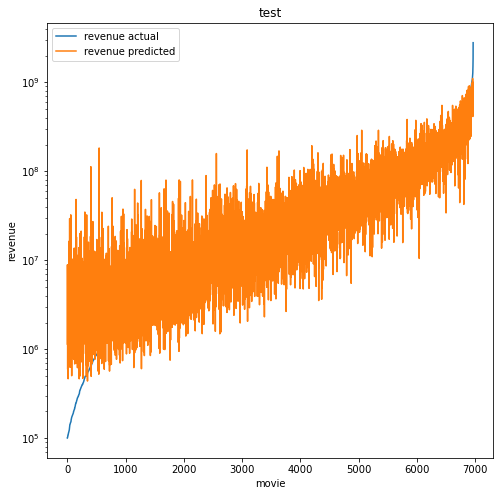

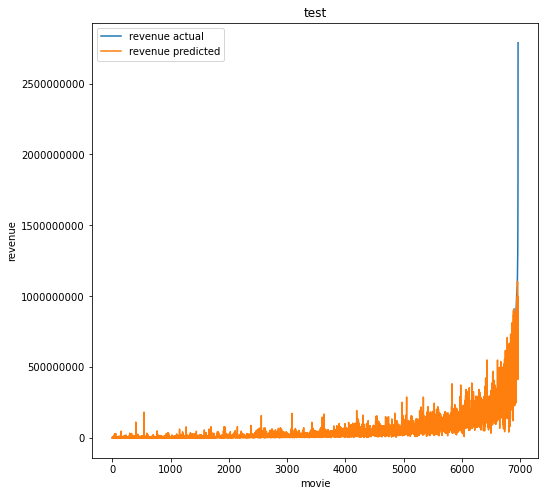

In [31]:
metricss(test_true, test_pred, X_train.shape[1])

test
smape: 56.156
mape: 159.256
wape: 33.716
mae: 25,442,044.000
rmse: 62,855,577.000
rmsle: 0.863
r2: 0.804
adj_r2: 0.798


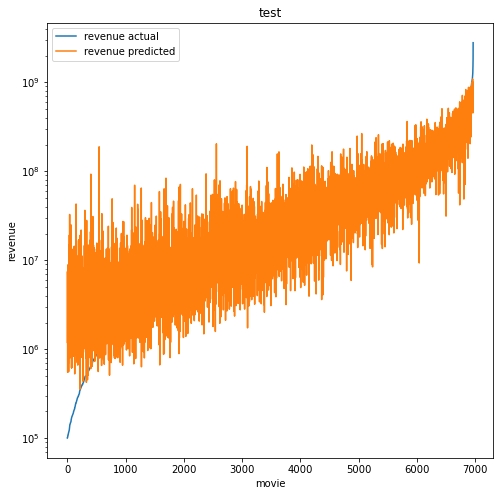

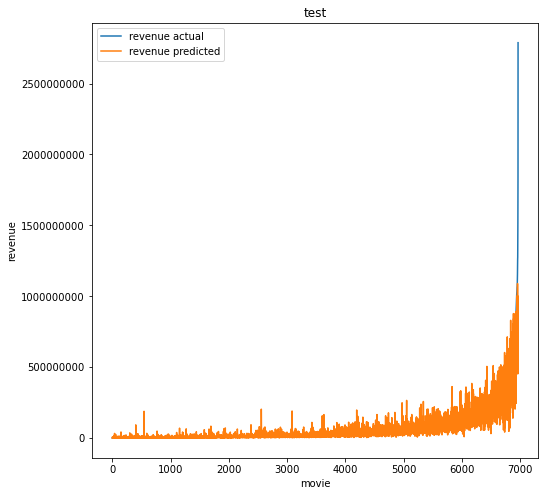

In [25]:
metricss(test_true, test_pred, X_train.shape[1])

test
smape: 56.160
mape: 158.632
wape: 33.584
mae: 25,342,469.000
rmse: 61,862,941.000
rmsle: 0.861
r2: 0.811
adj_r2: 0.804


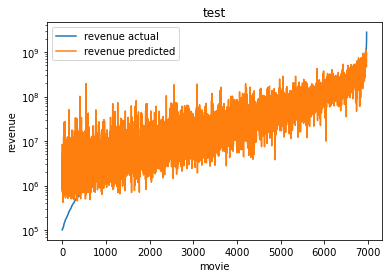

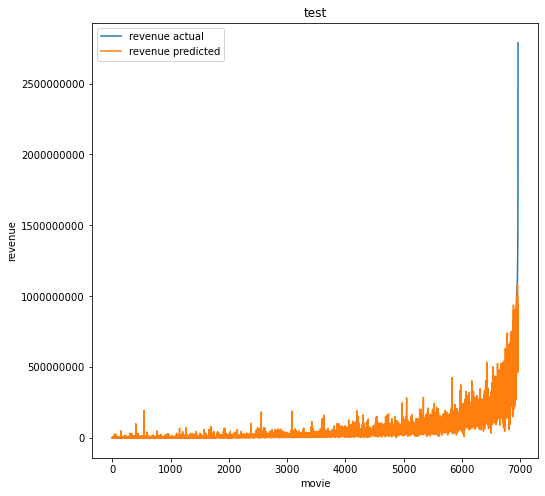

In [17]:
metricss(test_true, test_pred, X_train.shape[1])

In [86]:
%%time
test_true, test_pred = get_regression_cv_predictions(create_and_fit_lgb_regressor, X, y, patience=5)

split 1
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.231 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] min_sum_hessian_in_leaf is set=47, min_child_weight=0.148 will be ignored. Current value: min_sum_hessian_in_leaf=47
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=4 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.665, colsample_bytree=0.984 will be ignored. Current value: feature_fraction=0.665
Training until validation scores don't improve for 5 rounds
Early stopping, best iteration is:
[278]	valid_0's l1: 7.62077e+07	valid_0's l2: 2.5402e+16
model fit time: 4.630997180938721
split 2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.231 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] min_sum_hessian_in_leaf is set=47, min_chi

test
smape: 54.926
mape: 151.052
wape: 32.595
mae: 24,595,762.000
rmse: 59,907,849.000
adj_r2: 0.816


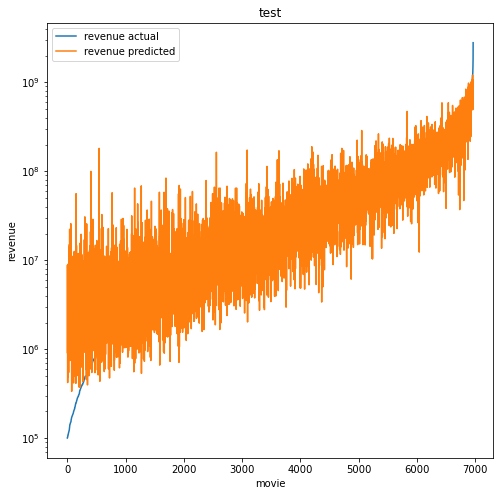

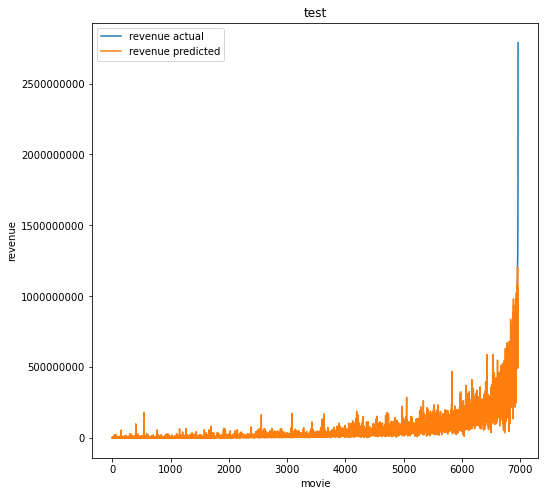

In [64]:
# power transform + standardize, y power transform + standardize
metricss(test_true, test_pred, X_train.shape[1])

test
smape: 54.720
mape: 150.708
wape: 32.328
mae: 24,394,930.000
rmse: 59,465,189.000
adj_r2: 0.819


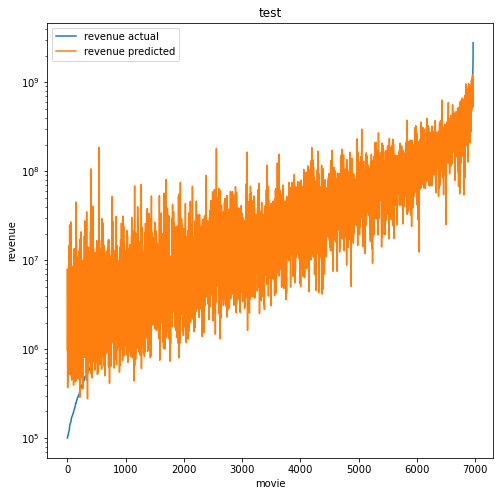

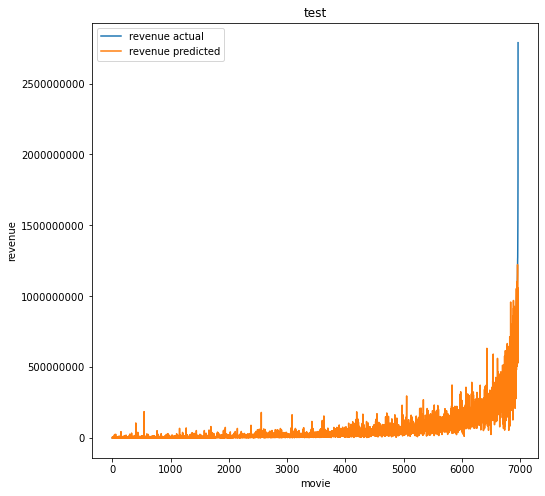

In [30]:
metricss(test_true, test_pred, X_train.shape[1])

In [16]:
def get_from_range(yt, yp, low, high):
    idx = [i for i, iy in enumerate(yt) if iy > low and iy <= high]
    return [yt[i] for i in idx], [yp[i] for i in idx]

def metricss(yt, yp, n_features):
    m = print_metrics(np.array(yt), np.array(yp), n_features, 'test')
    print_graphs(np.array(yt), np.array(yp), 'test', print_log=True)
    print_graphs(np.array(yt), np.array(yp), 'test', print_log=False)

def metricss_range(yt, yp, n_features, low, high):
    yt, yp = get_from_range(test_true, test_pred, 1000000, 10000000)
    m = print_metrics(np.array(yt), np.array(yp), n_features, 'test')
    print_graphs(np.array(yt), np.array(yp), 'test', print_log=True)
    print_graphs(np.array(yt), np.array(yp), 'test', print_log=False)

test
smape: 54.821
mape: 149.725
wape: 32.411
mae: 24,457,248.000
rmse: 59,561,111.000
adj_r2: 0.818


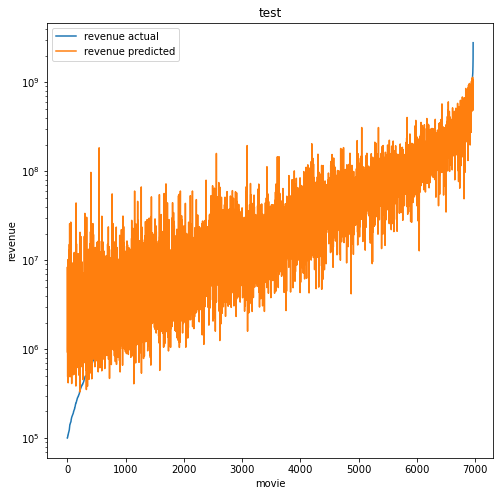

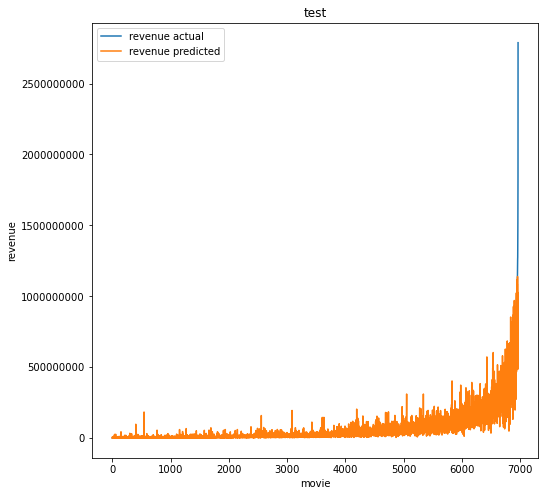

In [27]:
metricss(test_true, test_pred, X_train.shape[1])

test
smape: 62.244
mape: 122.005
wape: 89.753
mae: 4,172,067.000
rmse: 7,587,230.000
adj_r2: -8.346


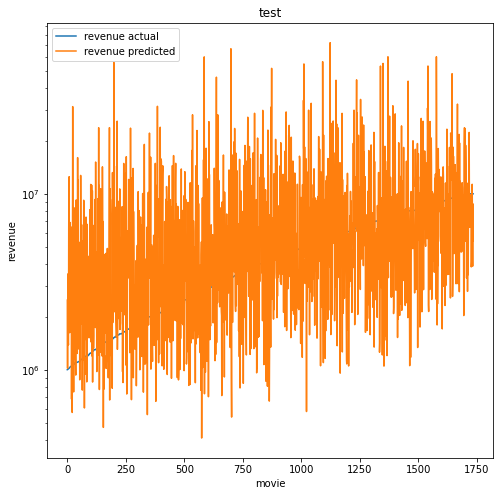

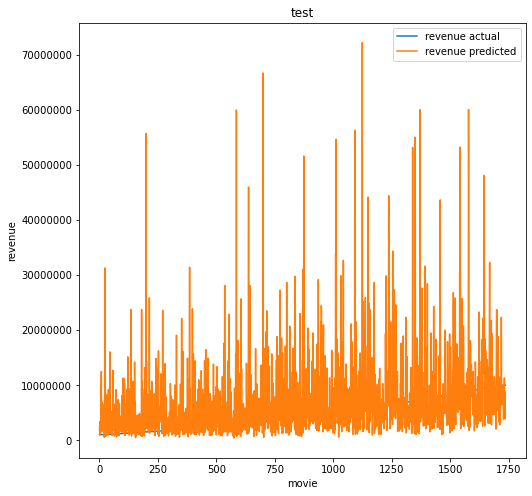

In [22]:
ytt, ypp = get_from_range(test_true, test_pred, 1000000, 10000000)
metricss(ytt, ypp, X_train.shape[1])

test
smape: 54.821
mape: 149.725
wape: 32.411
mae: 24,457,248.000
rmse: 59,561,111.000
adj_r2: 0.818


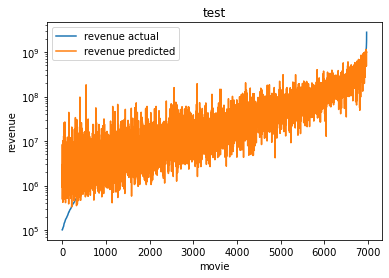

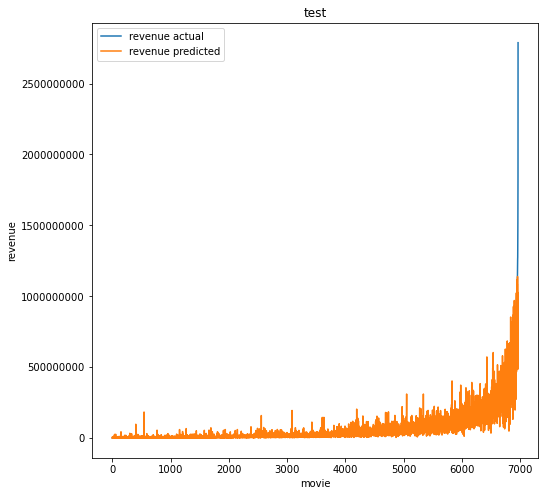

In [10]:
m = print_metrics(np.array(test_true), np.array(test_pred), X_train.shape[1], 'test')
print_graphs(np.array(test_true), np.array(test_pred), 'test', print_log=True)
print_graphs(np.array(test_true), np.array(test_pred), 'test', print_log=False)

In [34]:
print_output(cv_result['cv_metrics'])

smape: 54.7440690257915
mape: 150.58145770997874
mae: 24564582.8
rmse: 58286702.4
adj_r2: 0.7449856839330975


split 1
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.231 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] min_sum_hessian_in_leaf is set=47, min_child_weight=0.148 will be ignored. Current value: min_sum_hessian_in_leaf=47
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=4 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.665, colsample_bytree=0.984 will be ignored. Current value: feature_fraction=0.665
Training until validation scores don't improve for 30 rounds
Early stopping, best iteration is:
[915]	valid_0's l1: 6.68582e+07	valid_0's l2: 2.11128e+16
model fit time: 9.356332540512085
split 2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.231 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] min_sum_hessian_in_leaf is set=47, min_c

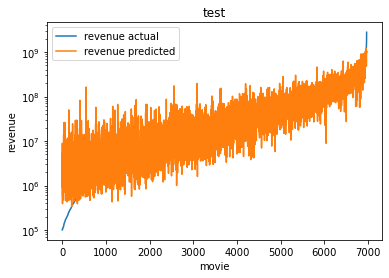

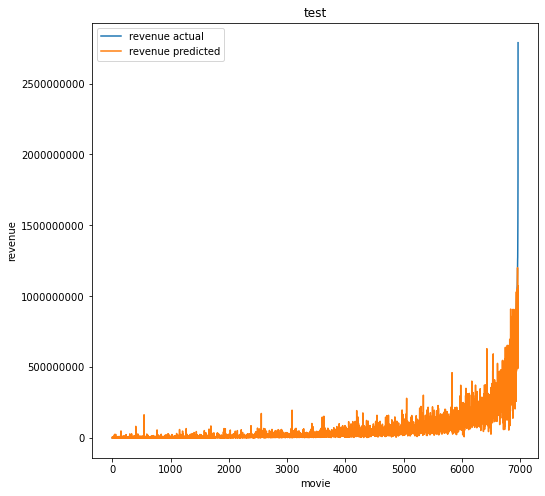

CPU times: user 11min 8s, sys: 6.26 s, total: 11min 14s
Wall time: 1min 44s


In [9]:
%%time
test_true, test_pred = get_regression_cv_predictions(create_and_fit_lgb_regressor, X, y, patience=30)
m = print_metrics(np.array(test_true), np.array(test_pred), X_train.shape[1], 'test')
print_graphs(np.array(test_true), np.array(test_pred), 'test', print_log=True)
print_graphs(np.array(test_true), np.array(test_pred), 'test', print_log=False)

In [11]:
for a in m:
    print(a, ': ', round(m[a], 3))

smape :  55.024
mape :  151.003
wmape :  32.578
mae :  24583620.0
rmse :  59334675.0
adj_r2 :  0.82


split 1
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.231 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] min_sum_hessian_in_leaf is set=47, min_child_weight=0.148 will be ignored. Current value: min_sum_hessian_in_leaf=47
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=4 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.665, colsample_bytree=0.984 will be ignored. Current value: feature_fraction=0.665
Training until validation scores don't improve for 30 rounds
Early stopping, best iteration is:
[765]	valid_0's l1: 6.5961e+07	valid_0's l2: 1.83517e+16
model fit time: 44.34779214859009
split 2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.231 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] min_sum_hessian_in_leaf is set=47, min_ch

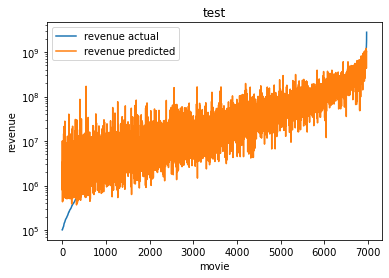

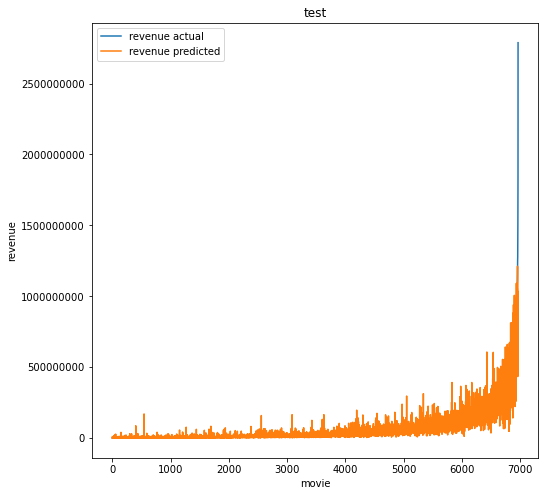

CPU times: user 39min 4s, sys: 36.6 s, total: 39min 41s
Wall time: 6min 39s


In [14]:
%%time
test_true, test_pred = get_regression_cv_predictions(create_and_fit_lgb_regressor, X, y, patience=30)
m = print_metrics(np.array(test_true), np.array(test_pred), X_train.shape[1], 'test')
print_graphs(np.array(test_true), np.array(test_pred), 'test', print_log=True)
print_graphs(np.array(test_true), np.array(test_pred), 'test', print_log=False)

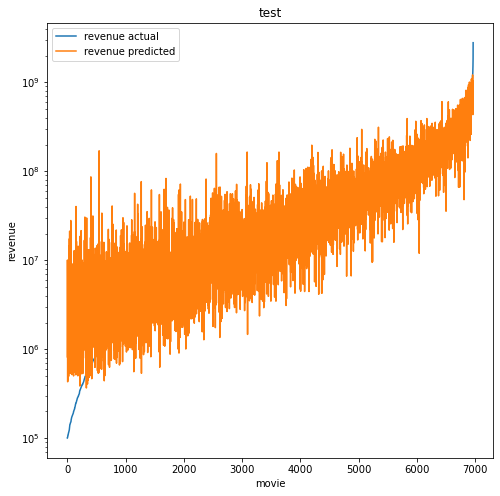

In [15]:
print_graphs(np.array(test_true), np.array(test_pred), 'test', print_log=True)

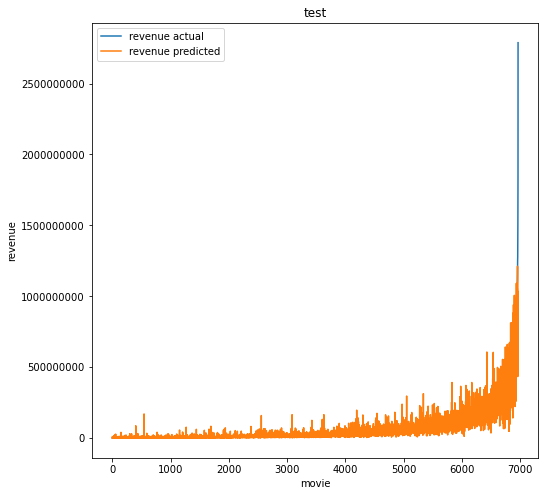

In [16]:
print_graphs(np.array(test_true), np.array(test_pred), 'test', print_log=False)

In [ ]:
def create_and_fit_lgb_regressor_with_params(X, y, X_val, y_val, patience=30, regressor_params=None, verbose=-1):
    start = time.time()
    model = TransformedTargetRegressor(
        Pipeline([
            ('powertransform', PowerTransformer()),
            ('model', lgb.LGBMRegressor(**regressor_params)),
        ]),
        PowerTransformer(),
    ).fit(X.values, y,
        model__verbose=verbose,
        model__eval_set=(X_val.values, y_val),
        model__early_stopping_rounds=patience,
        model__eval_metric='mean_absolute_error',
    )
    end = time.time()
    print(f'model fit time: {end - start}')
    return model

def create_regression_lgb():
    return lgb.LGBMRegressor(
        tree_learner='data',
        verbose=-1,
        n_jobs=-1,
        objective='mse',
        reg_lambda=0.435,
        num_leaves=98,
        max_depth=52,
        min_data_in_leaf=20,
        min_child_samples=4,
        bagging_freq=3,
        n_estimators=7149,
        min_sum_hessian_in_leaf=47,
        learning_rate=0.018,
        # learning_rate=0.001,
        feature_fraction=0.665,
        bagging_fraction=0.8,
        subsample=0.231,
        min_child_weight=0.148,
        colsample_bytree=0.984,
        reg_alpha=0.617,
    )

def create_and_fit_lgb_regressor(X, y, X_val, y_val, patience=30, regressor_params={}, verbose=-1):
    start = time.time()
    # model = TransformedTargetRegressor(
    #     TransformedTargetRegressor(
    #         Pipeline([
    #             ('powertransform', PowerTransformer()),
    #             ('model', create_regression_lgb()),
    #         ]),
    #         StandardScaler(with_std=True),
    #     ),
    #     PowerTransformer(standardize=True),
    # ).fit(X.values, y,
    #     model__verbose=verbose,
    #     model__eval_set=(X_val.values, y_val),
    #     model__early_stopping_rounds=patience,
    #     model__eval_metric='mean_absolute_error',
    # )

    # model = create_regression_lgb().fit(X.values, y,
    #     verbose=verbose,
    #     eval_set=(X_val.values, y_val),
    #     early_stopping_rounds=patience,
    #     eval_metric='mean_absolute_error',
    # )

    # model = Pipeline([
    #             ('powertransform', PowerTransformer()),
    #             ('model', create_regression_lgb()),
    # ]).fit(X.values, y,
    #     model__verbose=verbose,
    #     model__eval_set=(X_val.values, y_val),
    #     model__early_stopping_rounds=patience,
    #     model__eval_metric='mean_absolute_error',
    # )

    # model = TransformedTargetRegressor(
    #         Pipeline([
    #             ('powertransform', PowerTransformer()),
    #             ('model', create_regression_lgb()),
    #         ]),
    #         StandardScaler(with_std=True),
    # ).fit(X.values, y,
    #     model__verbose=verbose,
    #     model__eval_set=(X_val.values, y_val),
    #     model__early_stopping_rounds=patience,
    #     model__eval_metric='mean_absolute_error',
    # )

    model = TransformedTargetRegressor(
        Pipeline([
            ('imputer', KNNImputer(n_neighbors=30, weights='distance')),
            ('powertransform', PowerTransformer()),
            ('model', create_regression_lgb()),
        ]),
        make_pipeline(
            StandardScaler(with_std=False),
            PowerTransformer(standardize=True),
            # MinMaxScaler(),
            # PowerTransformer(standardize=True, method='box-cox'),
        ),
    ).fit(X.values, y,
        model__verbose=verbose,
        model__eval_set=(X_val.values, y_val),
        model__early_stopping_rounds=patience,
        model__eval_metric='mean_absolute_error',
    )

    end = time.time()
    print(f'model fit time: {end - start}')
    return model

In [ ]:
from sklearn.model_selection import KFold, train_test_split
from sklearn.pipeline import make_pipeline

# def get_regression_cv_predictions_ensemble(create_and_fit_fn, X, y, n_splits=10, patience=30, validation_size=0.05, verbose=-1):
def get_indices(y):
    return dict(
            indices_1M = [i for i in range(len(y)) if y[i] < 1000000],
            indices_1M_10M = [i for i in range(len(y)) if y[i] >= 1000000 and y[i] < 10000000],
            indices_10M_100M = [i for i in range(len(y)) if y[i] >= 10000000 and y[i] < 100000000],
            indices_100M = [i for i in range(len(y)) if y[i] >= 100000000],

            # indices_10M = [i for i in range(len(y)) if y[i] < 10000000],
            # indices_10M_100M = [i for i in range(len(y)) if y[i] >= 10000000 and y[i] < 100000000],
            # indices_100M = [i for i in range(len(y)) if y[i] >= 100000000],
    )
def sape(A,P):
    return 200 * np.abs(P - A) / (np.abs(A) + np.abs(P))

indices = get_indices(y_train.values)
# for idx in indices.values():
#     yy = [y_train.values[i] for i in idx]
#     preprocessor = make_pipeline(
#         StandardScaler(with_std=False),
#         PowerTransformer(standardize=True),
#     )
#     yt = preprocessor.fit_transform(np.array(yy).reshape(-1,1))
#     # print(idx)
#     print(np.min(yt))
#     print(np.max(yt))

# yt = preprocessor.fit_transform(np.array(y).reshape(-1,1))
# # print(idx)
# print(np.min(yt))
# print(np.max(yt))


predicted_values = []
for idx in indices.values():

    Xt, Xv, yt, yv = train_test_split(X_train.iloc[idx], [y_train.values[i] for i in idx], test_size=0.05)

    preprocessor = make_pipeline(
        StandardScaler(with_std=False),
        PowerTransformer(standardize=True),
    )
    yyy = preprocessor.fit_transform(np.array(yt).reshape(-1,1))
    # print(yyy)
    print(np.min(yyy))
    print(np.max(yyy))

    predicted_values.append(create_and_fit_lgb_regressor(Xt, yt, Xv, yv, patience=5000, verbose=-1).predict(X_test))
predicted_values = np.array(predicted_values).T
res_values = []
for i, y_true in enumerate(y_test.values):
    sape_values = [sape(y_true, y_pred) for y_pred in predicted_values[i]]
    best_value = predicted_values[i][np.argmin(sape_values)]
    # print(y_true)
    # print(predicted_values[i])
    # print(sape_values)
    # print('-----------------------------')
    res_values.append(best_value)
m = print_metrics(np.array(y_test), np.array(res_values), X_train.shape[1], 'test')
print_graphs(np.array(y_test), np.array(res_values), 'test', print_log=True)
print_graphs(np.array(y_test), np.array(res_values), 'test', print_log=False)

In [ ]:
from sklearn.model_selection import KFold, train_test_split

def get_regression_cv_predictions_ensemble(create_and_fit_fn, X, y, n_splits=10, patience=30, validation_size=0.05, verbose=-1):
    def get_indices(y):
        return dict(
            indices_1M = [i for i in range(len(y)) if y[i] < 1000000],
            indices_1M_10M = [i for i in range(len(y)) if y[i] >= 1000000 and y[i] < 10000000],
            indices_10M_100M = [i for i in range(len(y)) if y[i] >= 10000000 and y[i] < 100000000],
            indices_100M = [i for i in range(len(y)) if y[i] >= 100000000],
        )
    def sape(A,P):
        return 200 * np.abs(P - A) / (np.abs(A) + np.abs(P))

    test_true = []
    test_pred = []

    split_num=0
    kf = KFold(n_splits=n_splits)
    for train_index, test_index in kf.split(X, y):
        split_num+=1
        print(f'split {split_num}')
        X_train, X_test = X.iloc[train_index, :], X.iloc[test_index, :]
        y_train, y_test = y[train_index], y[test_index]
        indices = get_indices(y_train)
        predicted_values = []
        for idx in indices.values():
            Xt, Xv, yt, yv = train_test_split(X_train.iloc[idx], [y_train[i] for i in idx], test_size=validation_size)
            predicted_values.append(np.nan_to_num(create_and_fit_fn(Xt, yt, Xv, yv, patience=patience, verbose=verbose).predict(X_test)))
        predicted_values = np.array(predicted_values).T
        res_values = []
        for i, y_true in enumerate(y_test):
            sape_values = [sape(y_true, y_pred) for y_pred in predicted_values[i]]
            best_value = predicted_values[i][np.argmin(sape_values)]
            res_values.append(best_value)
        test_true.extend(y_test)
        test_pred.extend(res_values)
    return test_true, test_pred